In [67]:
from reportparse.structure.document import Document
import pandas as pd
import matplotlib.pyplot as plt
from collections import defaultdict
import re
from sklearn.preprocessing import MinMaxScaler
import numpy as np
import matplotlib.pyplot as plt
import re
from sklearn.preprocessing import MinMaxScaler
import numpy as np
import matplotlib.pyplot as plt
import re
import pandas as pd
import re
from collections import defaultdict

In [68]:
# # Connect to MongoDB
# print("Connecting to MongoDB...")
# client = MongoClient("mongodb://localhost:27017/")
# db = client["pdf_annotations"]
# collection = db["annotations"]
# print("Connected to MongoDB.")

# # Fetch the document from MongoDB
pdf_id = "examplesoloagg.pdf"  # Replace with your actual PDF name
# document_data = collection.find_one({"name": pdf_id})
document_data = None

if document_data:
    document = Document.from_dict(document_data)
    df = document.to_dataframe_ext(level='page')

    print("DataFrame created successfully.")
else:
    print(f"Document '{pdf_id}' not found in the database.")
    print("Loading from file...")
    document = Document.from_json_file('results/example.pdf.json')
    df = document.to_dataframe_ext(level='page')
    document = Document.from_json_file('results/Apple_Environmental_Progress_Report_2023-8-16.pdf.json')
    df1 = document.to_dataframe_ext(level='page')
    document = Document.from_json_file('results/fy2023-walmart-esg-highlights-3-10.pdf.json')
    df2 = document.to_dataframe_ext(level='page')
    document = Document.from_json_file('results/shell-annual-report-2024-95-102.pdf.json')
    df3 = document.to_dataframe_ext(level='page')
    
print()


Document 'examplesoloagg.pdf' not found in the database.
Loading from file...



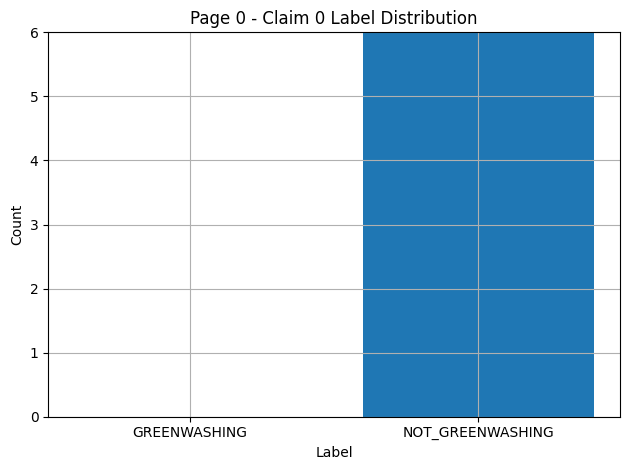

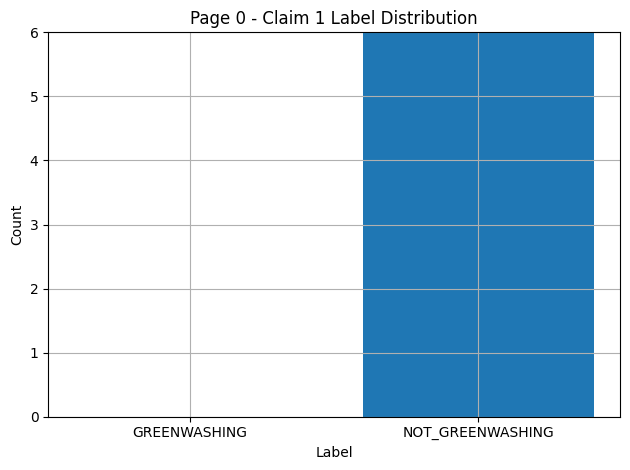

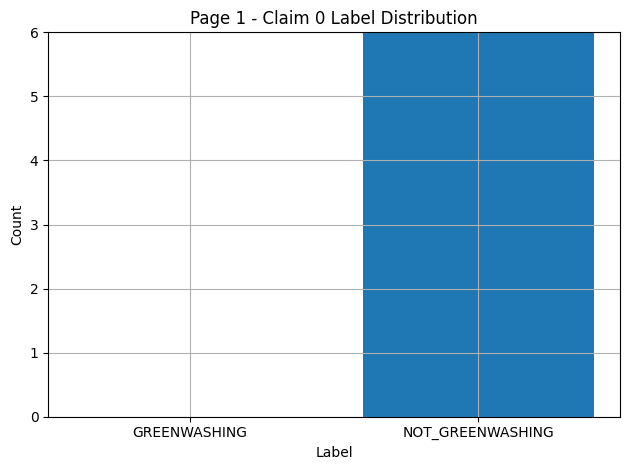

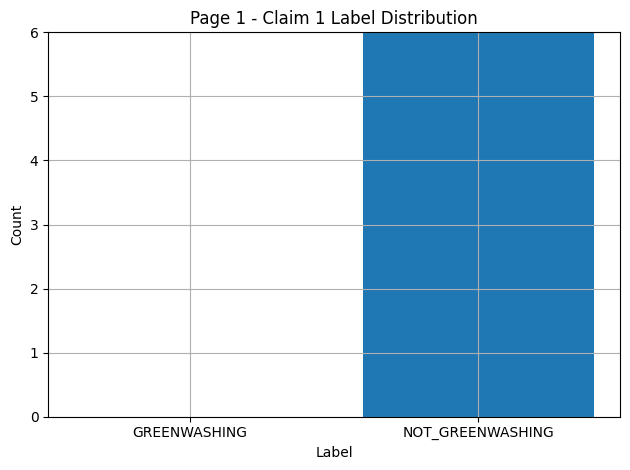

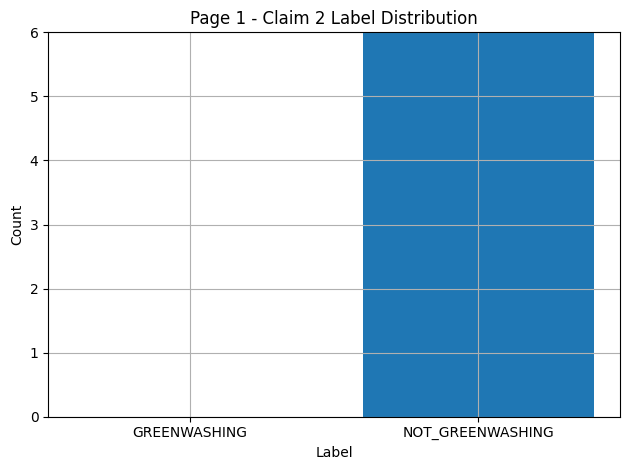

...

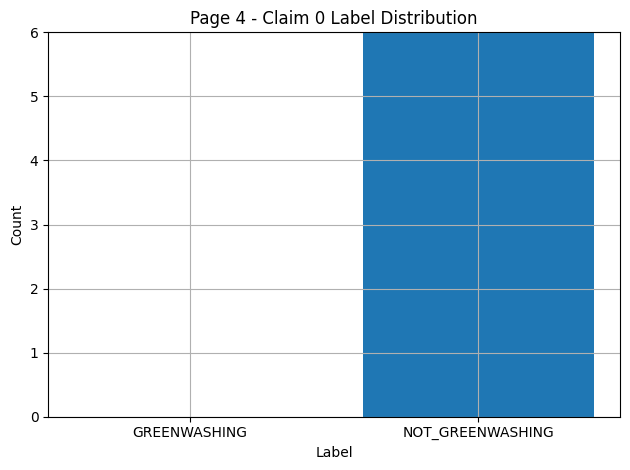

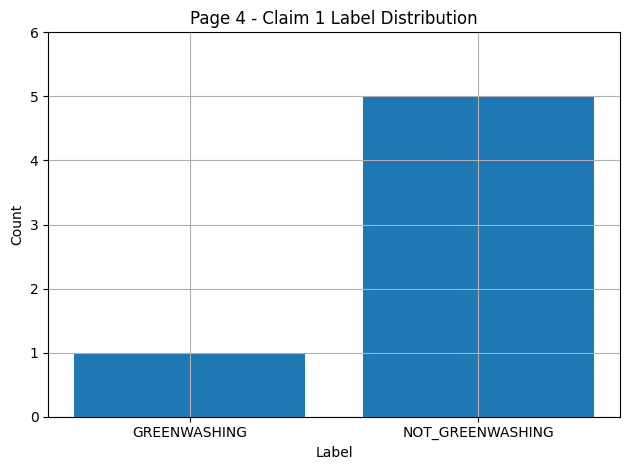

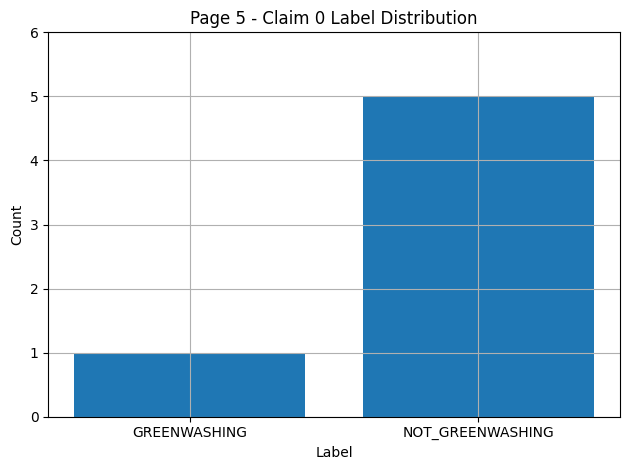

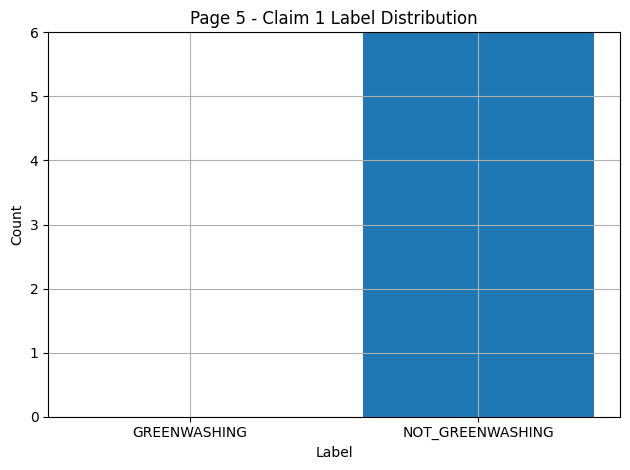

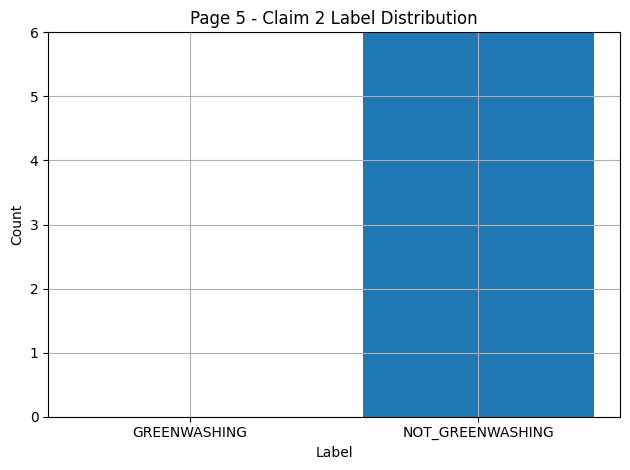

In [69]:


# Sample structure simulation for function (since no file was provided, we simulate the processing)
# Let's assume df is loaded externally; here we define the function again and simulate processing and plotting

def analyze_claim_label_discrepancies(df):
    label_cols = [col for col in df.columns if col.startswith("meta_") and col.endswith("_label")]

    claim_indices = sorted({
        re.search(r"claim_(\d+)", col).group(1)
        for col in label_cols if re.search(r"claim_(\d+)", col)
    }, key=int)

    flat_results = []

    for idx, row in df.iterrows():
        for claim_idx in claim_indices:
            label_counts = defaultdict(int)

            for col in label_cols:
                if f"claim_{claim_idx}" in col:
                    label = row[col]
                    if pd.isna(label) or label == '':
                        continue
                    label = label.strip().replace("*", "").upper()
                    if label in ("GREENWASHING", "NOT_GREENWASHING"):
                        label_counts[label] += 1

            if label_counts:
                flat_results.append({
                    "page_index": idx,
                    "claim_index": int(claim_idx),
                    "GREENWASHING": label_counts.get("GREENWASHING", 0),
                    "NOT_GREENWASHING": label_counts.get("NOT_GREENWASHING", 0),
                    "discrepancy": len(label_counts) > 1
                })

    return pd.DataFrame(flat_results)
result_df = analyze_claim_label_discrepancies(df)

# Plotting
grouped = result_df.groupby(['page_index', 'claim_index']).sum(numeric_only=True).reset_index()

# Bar plot per claim across pages
for (page, claim), group in grouped.groupby(['page_index', 'claim_index']):
    plt.figure()
    plt.bar(['GREENWASHING', 'NOT_GREENWASHING'], [group['GREENWASHING'].values[0], group['NOT_GREENWASHING'].values[0]])
    plt.title(f"Page {page} - Claim {claim} Label Distribution")
    plt.ylabel("Count")
    plt.xlabel("Label")
    plt.ylim(0, 6)
    plt.grid(True)
    plt.tight_layout()
    plt.show()


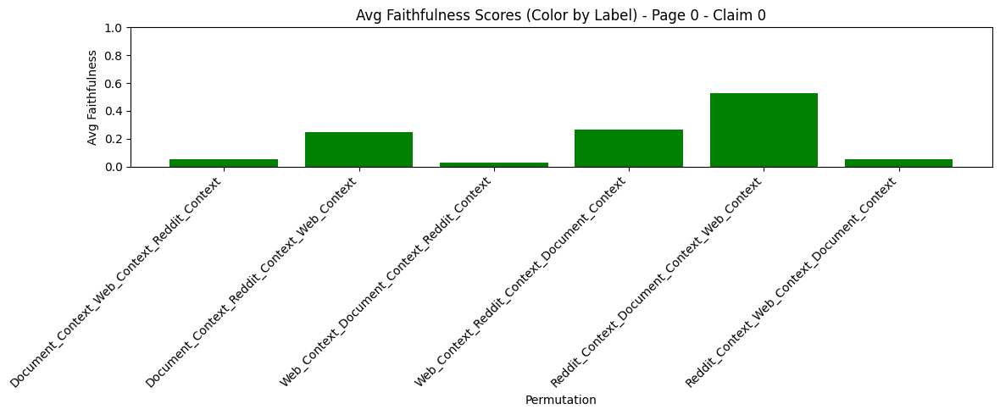

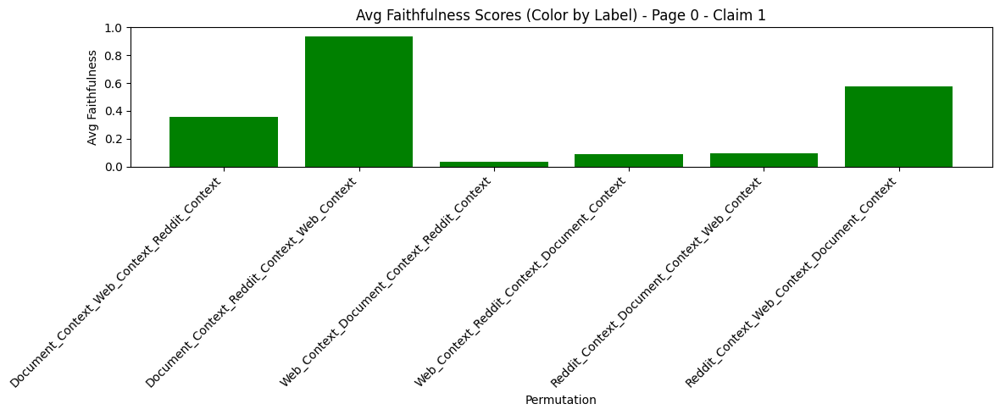

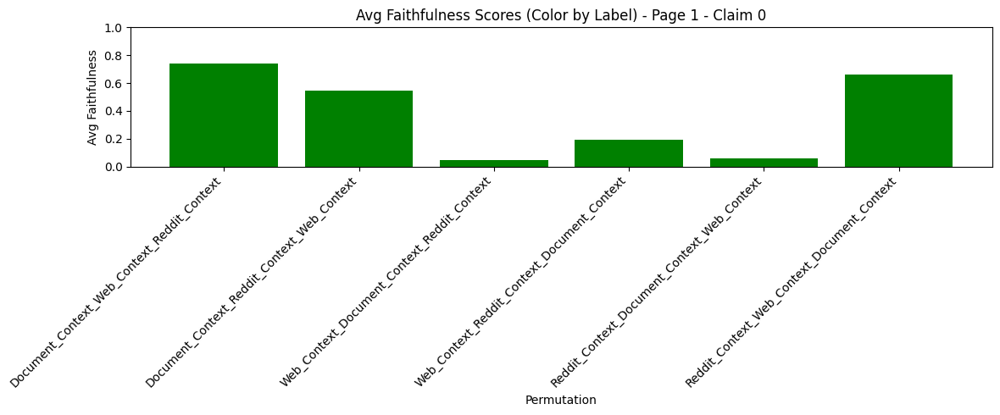

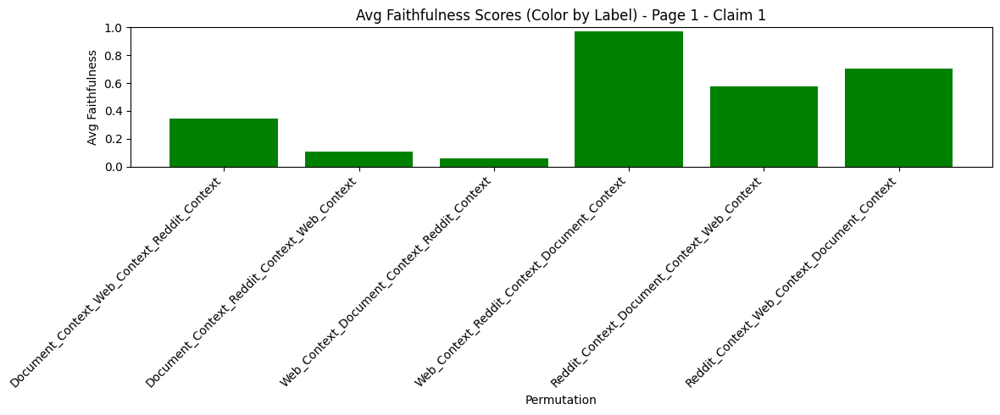

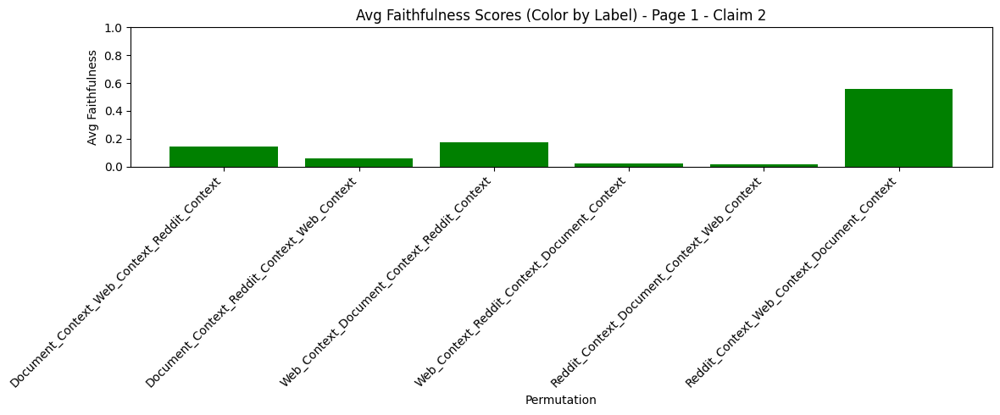

...

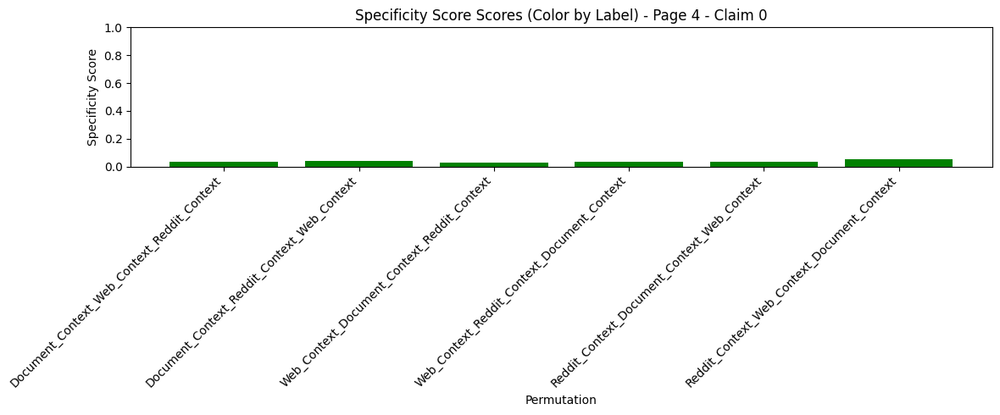

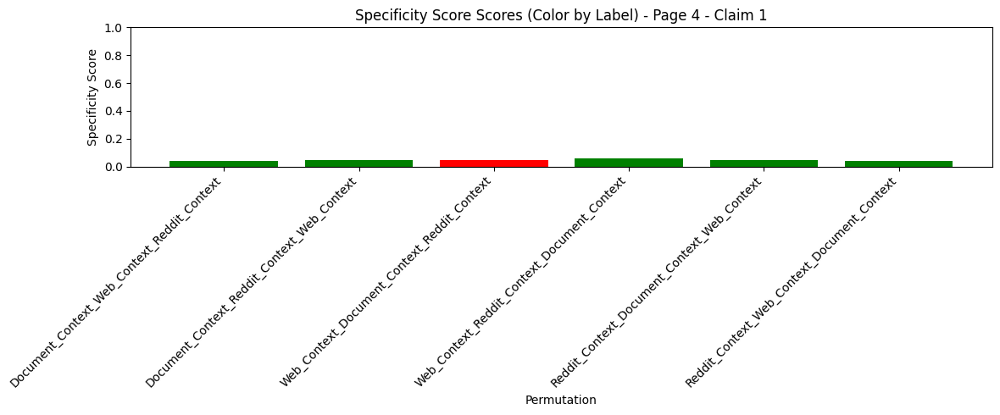

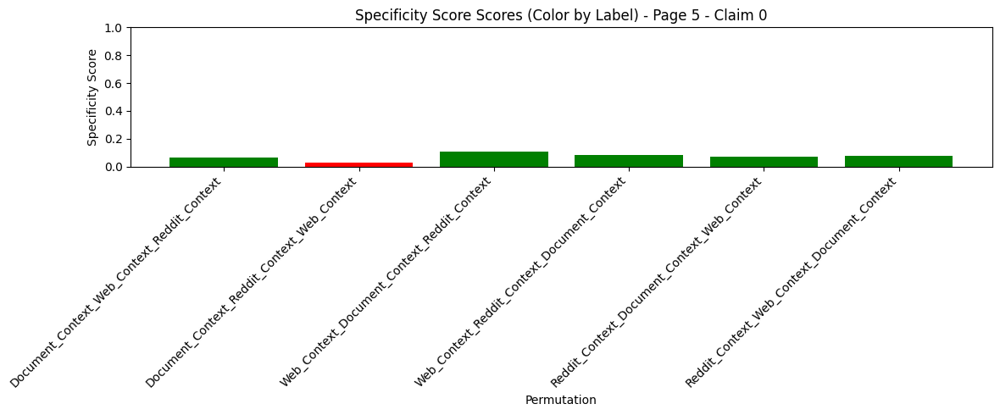

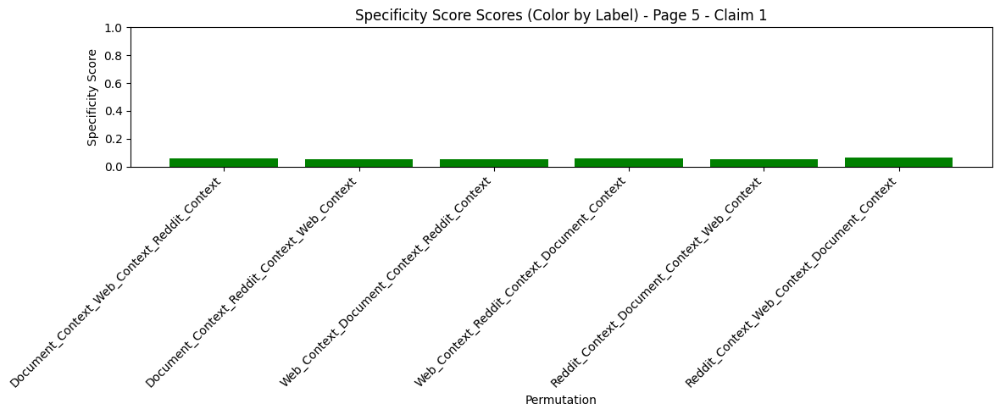

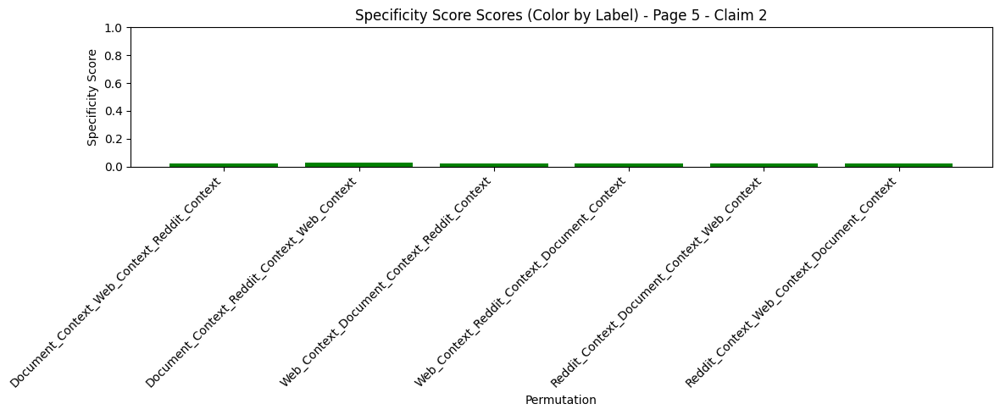

In [70]:
eval_metric_map = {
    "faith_eval": "avg_faithfulness",
    "groundedness_eval": "groundedness_score",
    "readability_eval": "readability_score",
    "redundancy_eval": "redundancy_score",
    "specificity_eval": "specificity_score",
}
def extract_claim_index(colname):
    match = re.search(r'claim_(\d+)', colname)
    return int(match.group(1)) if match else -1
label_colors = {
    "GREENWASHING": "red",
    "NOT_GREENWASHING": "green",
    "INVALID": "gray"
}
# Plotting all permutations per metric per claim
# Improved plotting with None filtering
for eval_suffix, score_key in eval_metric_map.items():
    for page_index, row in df.iterrows():
        metric_cols = [col for col in df.columns if col.endswith(f"_{eval_suffix}")]
        claims_by_index = {}

        for col in metric_cols:
            claim_idx = extract_claim_index(col)
            if claim_idx not in claims_by_index:
                claims_by_index[claim_idx] = []
            val = row.get(col)
            score = val.get(score_key) if isinstance(val, dict) else None
            claims_by_index[claim_idx].append((col, score))

        for claim_idx, entries in claims_by_index.items():
            plot_data = []
            for col, score in entries:
                if score is None:
                    continue
                # Derive corresponding label column
                label_col = col.replace(f"_{eval_suffix}", "_label")
                label_val = row.get(label_col, "")
                norm_label = label_val.strip().replace("*", "").upper() if isinstance(label_val, str) else "INVALID"
                if norm_label not in label_colors:
                    norm_label = "INVALID"
                plot_data.append((col, score, norm_label))

            if not plot_data:
                continue

            labels = [re.sub(r"meta_aggregator_|_result.*", "", col) for col, _, _ in plot_data]
            scores = [score for _, score, _ in plot_data]
            colors = [label_colors[label] for _, _, label in plot_data]

            plt.figure(figsize=(12, 5))
            plt.bar(range(len(scores)), scores, color=colors)
            plt.xticks(range(len(scores)), labels, rotation=45, ha="right")
            plt.ylim(0, 1)
            plt.title(f"{score_key.replace('_', ' ').title()} Scores (Color by Label) - Page {page_index} - Claim {claim_idx}")
            plt.ylabel(score_key.replace('_', ' ').title())
            plt.xlabel("Permutation")
            plt.tight_layout()
            plt.show()

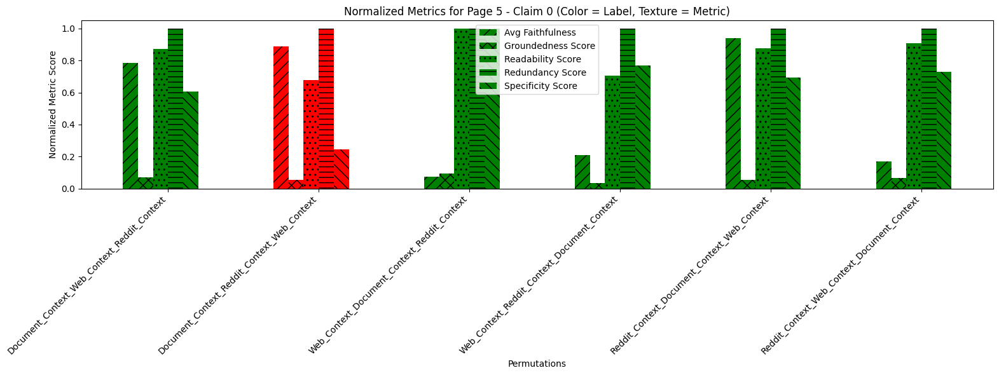

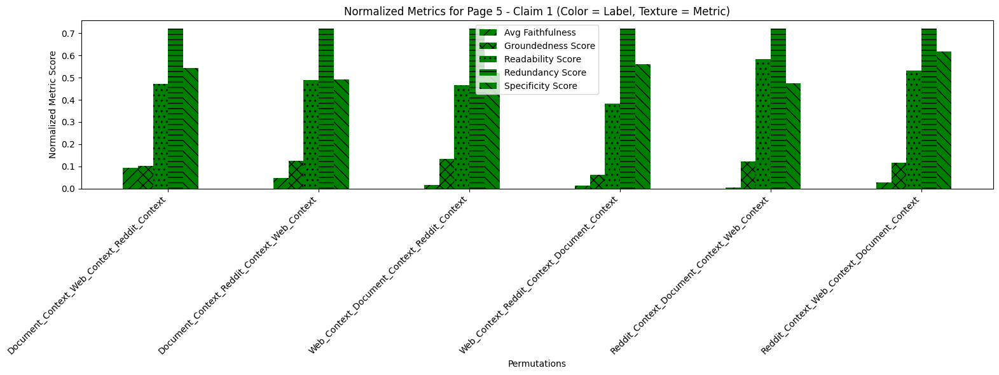

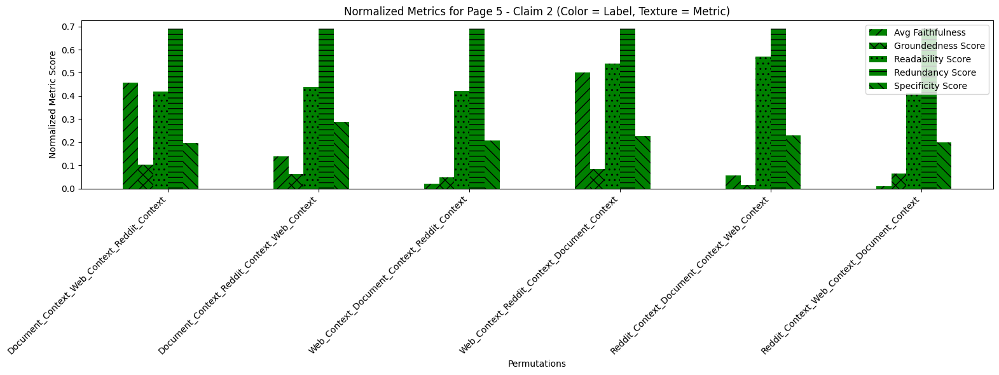

In [71]:


eval_metric_map = {
    "faith_eval": "avg_faithfulness",
    "groundedness_eval": "groundedness_score",
    "readability_eval": "readability_score",
    "redundancy_eval": "redundancy_score",
    "specificity_eval": "specificity_score",
}

label_colors = {
    "GREENWASHING": "red",
    "NOT_GREENWASHING": "green",
    "INVALID": "gray"
}

metric_values = {metric: [] for metric in eval_metric_map.values()}
for col in df.columns:
    for suffix, metric in eval_metric_map.items():
        if col.endswith(f"_{suffix}"):
            df[col] = df[col].apply(lambda x: x if isinstance(x, dict) else {})
            metric_values[metric].extend([
                val[metric] for val in df[col] if metric in val
            ])

scalers = {
    metric: MinMaxScaler().fit(np.array(vals).reshape(-1, 1)) 
    for metric, vals in metric_values.items() if vals
}


for page_index, row in df.iterrows():
    perm_data = {}

    for col in df.columns:
        for suffix, metric in eval_metric_map.items():
            if col.endswith(f"_{suffix}"):
                match = re.search(r"claim_(\d+)", col)
                if not match:
                    continue
                claim_idx = int(match.group(1))
                base_key = col.replace(f"_{suffix}", "")
                val = row[col]
                if isinstance(val, dict) and metric in val and metric in scalers:
                    norm_val = scalers[metric].transform([[val[metric]]])[0][0]
                    key = (page_index, claim_idx, base_key)
                    if key not in perm_data:
                        perm_data[key] = {"scores": {}, "label": "INVALID"}
                    perm_data[key]["scores"][metric] = norm_val

    perm_data = {
        key: value for key, value in perm_data.items() if value["scores"]
    }

    for (pg, claim_idx, base_key) in perm_data:
        label_col = f"{base_key}_label"
        label_val = row.get(label_col, "")
        norm_label = label_val.strip().replace("*", "").upper() if isinstance(label_val, str) else "INVALID"
        perm_data[(pg, claim_idx, base_key)]["label"] = norm_label if norm_label in label_colors else "INVALID"

    claims_grouped = defaultdict(list)
    for (pg, claim_idx, base_key), data in perm_data.items():
        claims_grouped[claim_idx].append((base_key, data["scores"], data["label"]))

# Define hatch patterns for each metric
metric_hatches = {
    "avg_faithfulness": "//",
    "groundedness_score": "xx",
    "readability_score": "..",
    "redundancy_score": "--",
    "specificity_score": "\\\\"
}

for claim_idx, entries in claims_grouped.items():
    metrics = list(eval_metric_map.values())
    bar_width = 0.1
    x = range(len(entries))
    offsets = [i * bar_width for i in range(len(metrics))]

    plt.figure(figsize=(16, 6))

    for i, metric in enumerate(metrics):
        values = [scores.get(metric, 0) for _, scores, _ in entries]
        colors = [label_colors[label] for _, _, label in entries]
        h = metric_hatches.get(metric, '')
        bars = plt.bar(
            [xi + offsets[i] for xi in x], values,
            width=bar_width,
            label=metric.replace("_", " ").title(),
            color=colors,
            hatch=h
        )

    xticklabels = [re.sub(r"meta_aggregator_|_result.*", "", key) for key, _, _ in entries]
    plt.xticks([xi + bar_width * (len(metrics) / 2) for xi in x], xticklabels, rotation=45, ha="right")

    plt.xlabel("Permutations")
    plt.ylabel("Normalized Metric Score")
    plt.title(f"Normalized Metrics for Page {page_index} - Claim {claim_idx} (Color = Label, Texture = Metric)")
    plt.legend()
    plt.tight_layout()
    plt.show()


In [72]:
import pandas as pd
import re

def analyze_claims(df):
    # Get all column names that match the expected pattern
    claim_cols = [col for col in df.columns if re.match(r"meta_cti_results_\d+_claim", col)]
    print(claim_cols)
    results = []
    total_non_specific_commitment_yes = 0
    total_commitment_yes = 0

    for idx, row in df.iterrows():
        print(f"Processing Page: {idx}")
        
        # Extract the unique claim indices from the claim columns
        claim_set = set(re.findall(r"meta_cti_results_(\d+)_", " ".join(claim_cols)))
        print("claim set", claim_set)
        total_claims = len(claim_set)
        print("Total claims:", total_claims)
        # Filter out claims that have missing detection values
        for claim_idx in claim_set:
            detection_column = f'meta_cti_results_{claim_idx}_cti_metrics_climate'
            
            detection_value = row.get(detection_column, None)
            
            # If the detection_value is a list or array, extract the first element (tuple) and check for NaN
            if isinstance(detection_value, list) and len(detection_value) > 0:
                detection_value = detection_value[0][0]  # Extract the first element of the tuple, e.g., "yes"
            
            # If the detection value is NaN, ignore this claim
            if pd.isna(detection_value):
                total_claims -= 1
                
        print("Marked claims:", total_claims, "Page:", idx)
        commitment_yes = 0
        detection_yes = 0
        non_specific_commitment_yes = 0

        for i in range(total_claims):
            detection_col = f"meta_cti_results_{i}_cti_metrics_climate"
            commitment_col = f"meta_cti_results_{i}_cti_metrics_commitment"
            specificity_col = f"meta_cti_results_{i}_cti_metrics_specificity"

            detection = row.get(detection_col, [])
            commitment = row.get(commitment_col, [])
            specificity = row.get(specificity_col, [])

            # extract the first value from tuples if they exist (tuples have both label and confidence score)
            detection_label = detection[0][0] if isinstance(detection, list) and detection else None
            commitment_label = commitment[0][0] if isinstance(commitment, list) and commitment else None
            specificity_label = specificity[0][0] if isinstance(specificity, list) and specificity else None

            if detection_label == "yes":
                detection_yes += 1

            if commitment_label == "yes":
                commitment_yes += 1
                total_commitment_yes += 1
                if specificity_label == "non":
                    non_specific_commitment_yes += 1
                    total_non_specific_commitment_yes += 1

        # Compute the fraction
        ratio = (non_specific_commitment_yes / commitment_yes) if commitment_yes > 0 else None

        results.append({
            "page_id": row["page_id"],
            "total_claims": total_claims,
            "commitment_yes": commitment_yes,
            "detection_yes": detection_yes,
            "non_specific_commitment_yes": non_specific_commitment_yes,
            "non_specific_commitment_ratio": ratio
        })

    # Compute the overall CTI
    overall_cti = total_non_specific_commitment_yes / total_commitment_yes if total_commitment_yes > 0 else None

    return pd.DataFrame(results), overall_cti

cti_df, overall_cti = analyze_claims(df)

print(cti_df)
print()
if overall_cti is not None:
    print(f"Overall CTI: {overall_cti}")
else:
    print("Overall CTI: N/A")

['meta_cti_results_0_claim', 'meta_cti_results_1_claim', 'meta_cti_results_2_claim', 'meta_cti_results_3_claim']
Processing Page: 0
claim set {'2', '3', '0', '1'}
Total claims: 4
Marked claims: 2 Page: 0
Processing Page: 1
claim set {'2', '3', '0', '1'}
Total claims: 4
Marked claims: 4 Page: 1
Processing Page: 2
claim set {'2', '3', '0', '1'}
Total claims: 4
Marked claims: 3 Page: 2
Processing Page: 3
claim set {'2', '3', '0', '1'}
Total claims: 4
Marked claims: 3 Page: 3
Processing Page: 4
claim set {'2', '3', '0', '1'}
Total claims: 4
Marked claims: 2 Page: 4
Processing Page: 5
claim set {'2', '3', '0', '1'}
Total claims: 4
Marked claims: 3 Page: 5
      page_id  total_claims  commitment_yes  detection_yes  \
0  page_idx_0             2               2              2   
1  page_idx_1             4               3              4   
2  page_idx_2             3               2              1   
3  page_idx_3             3               2              3   
4  page_idx_4             2    

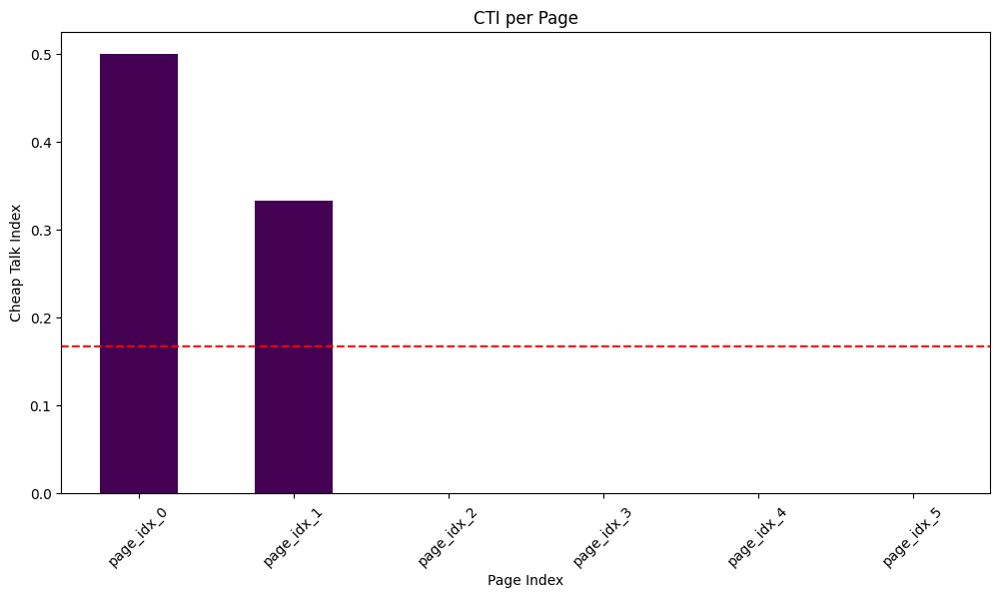

Overall CTI: 0.1667


In [73]:
# bar plot summary_df["non_specific_commitment_ratio"] and overall cti
cti_df["non_specific_commitment_ratio"].plot(kind='bar', figsize=(12, 6), colormap='viridis')
plt.axhline(y=overall_cti, color='red', linestyle='--', label=f'Overall CTI: {overall_cti:.4f}')
plt.xlabel("Page Index")
plt.ylabel("Cheap Talk Index")
plt.title("CTI per Page")
plt.xticks(np.arange(len(cti_df.index)), cti_df["page_id"], rotation=45)
plt.show()

print(f"Overall CTI: {overall_cti:.4f}")


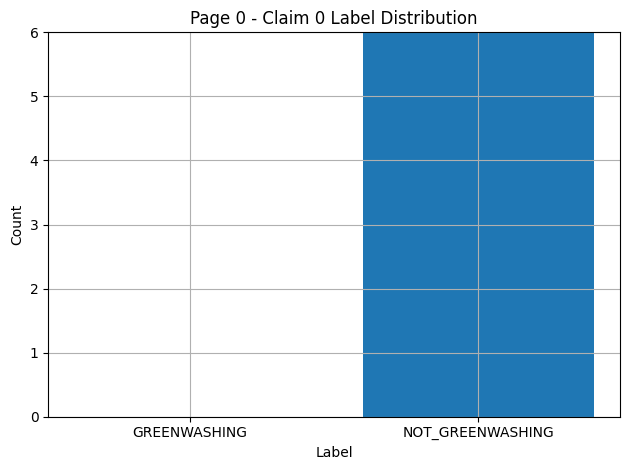

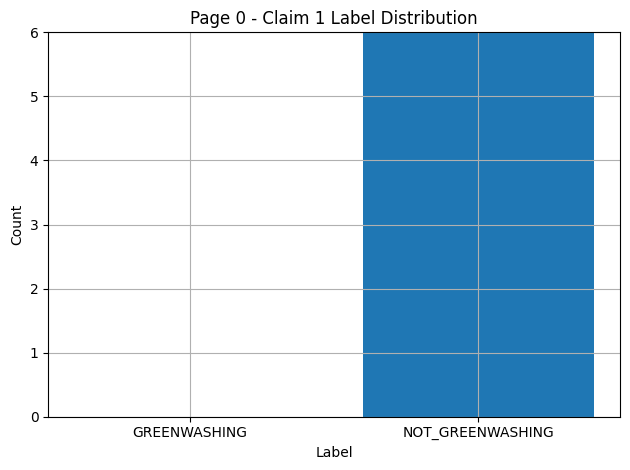

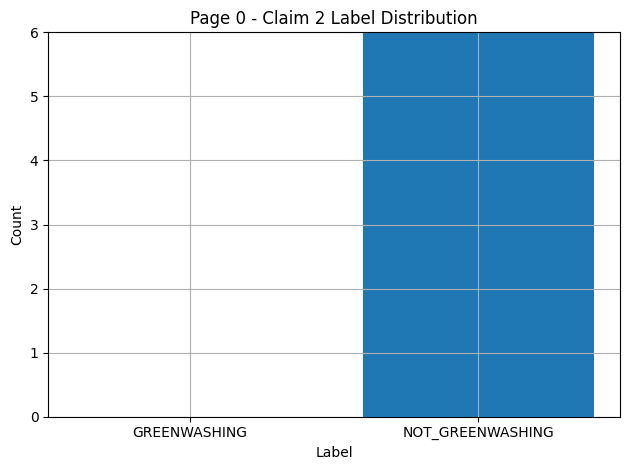

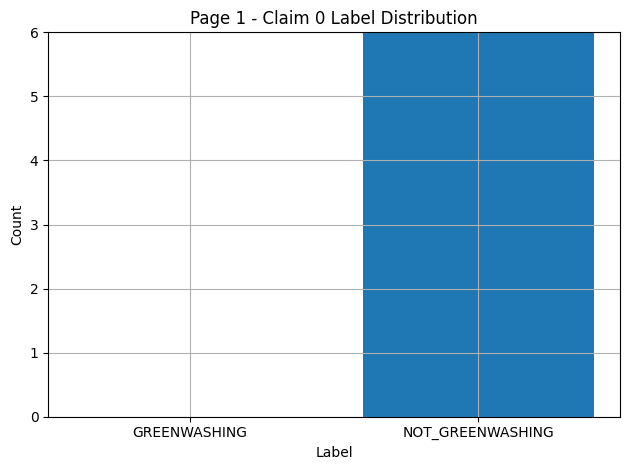

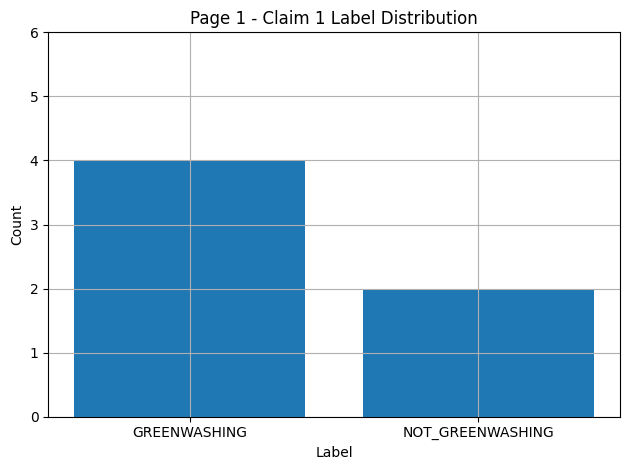

...

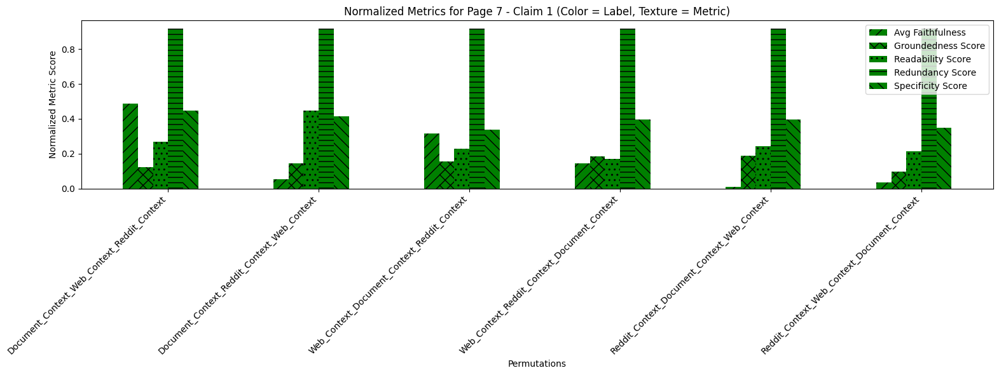

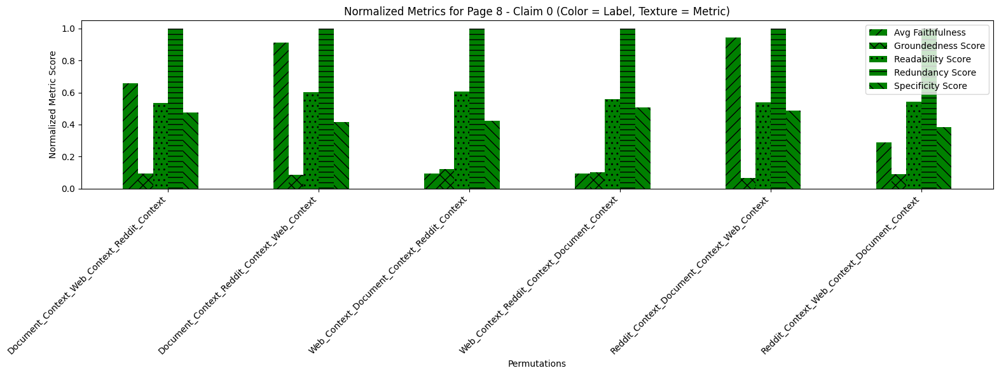

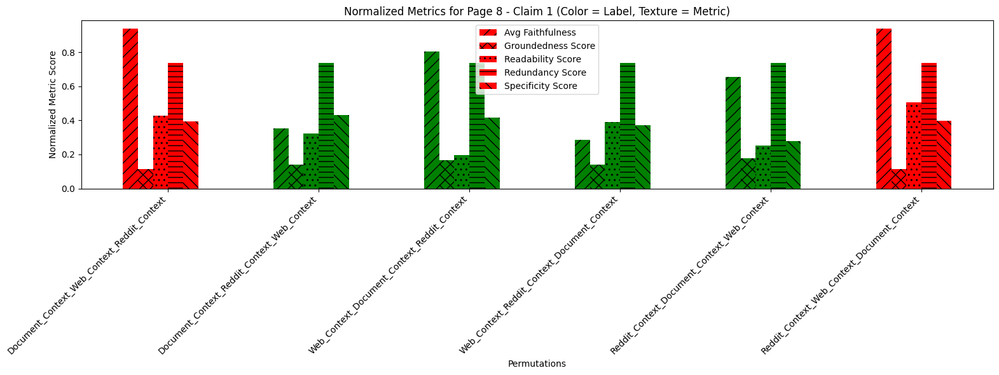

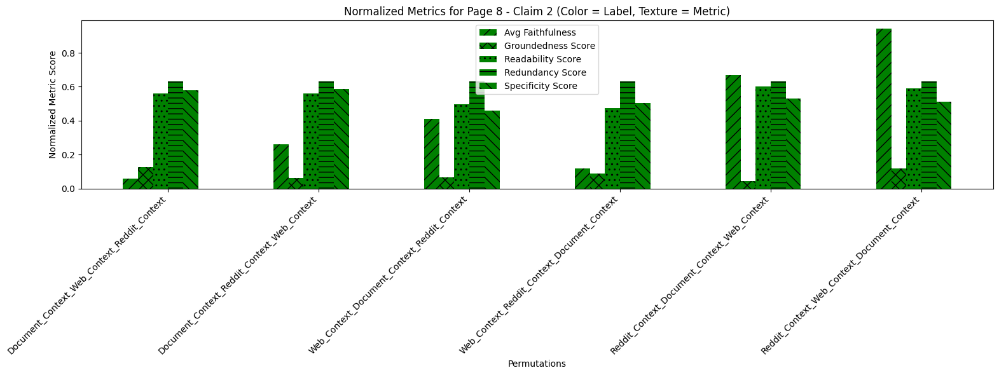

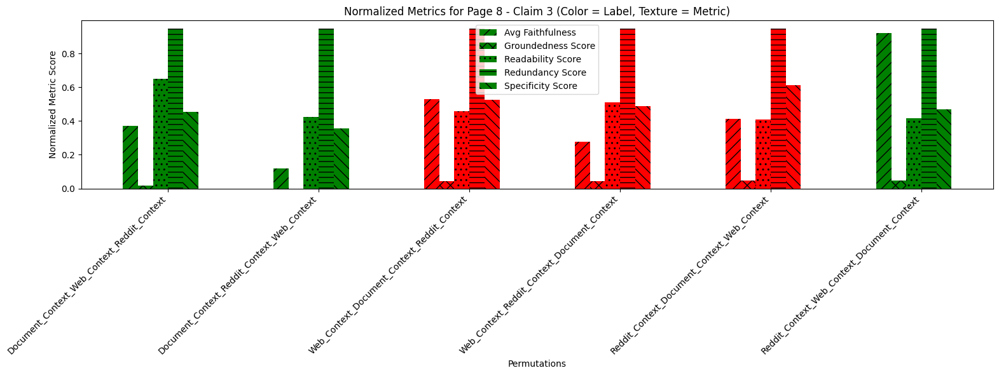

['meta_cti_results_0_claim', 'meta_cti_results_1_claim', 'meta_cti_results_2_claim', 'meta_cti_results_3_claim', 'meta_cti_results_4_claim', 'meta_cti_results_5_claim']
Processing Page: 0
claim set {'2', '0', '1', '4', '3', '5'}
Total claims: 6
Marked claims: 3 Page: 0
Processing Page: 1
claim set {'2', '0', '1', '4', '3', '5'}
Total claims: 6
Marked claims: 4 Page: 1
Processing Page: 2
claim set {'2', '0', '1', '4', '3', '5'}
Total claims: 6
Marked claims: 6 Page: 2
Processing Page: 3
claim set {'2', '0', '1', '4', '3', '5'}
Total claims: 6
Marked claims: 3 Page: 3
Processing Page: 4
claim set {'2', '0', '1', '4', '3', '5'}
Total claims: 6
Marked claims: 3 Page: 4
Processing Page: 5
claim set {'2', '0', '1', '4', '3', '5'}
Total claims: 6
Marked claims: 2 Page: 5
Processing Page: 6
claim set {'2', '0', '1', '4', '3', '5'}
Total claims: 6
Marked claims: 3 Page: 6
Processing Page: 7
claim set {'2', '0', '1', '4', '3', '5'}
Total claims: 6
Marked claims: 2 Page: 7
Processing Page: 8
clai

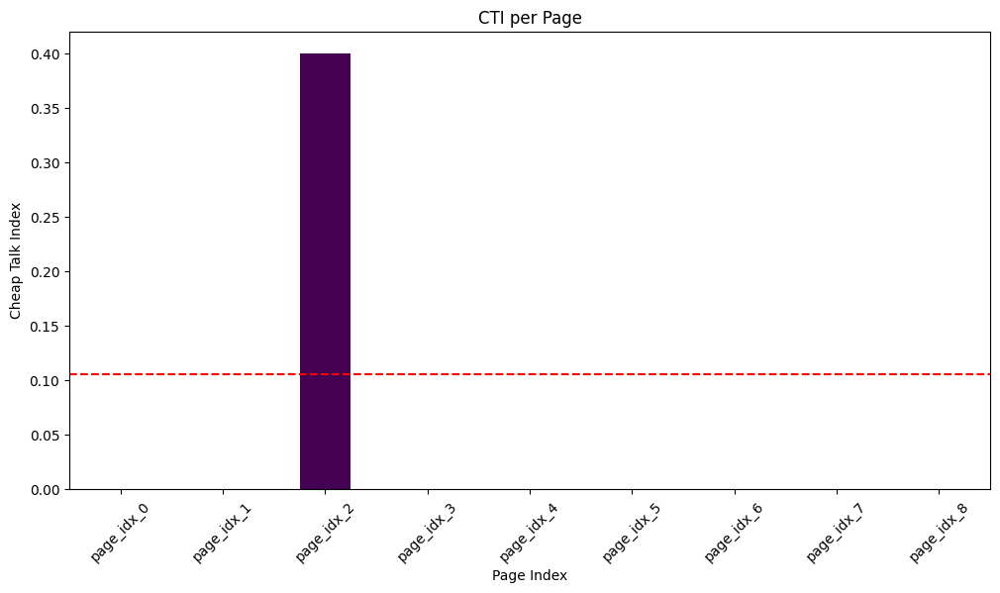

Overall CTI: 0.1053


In [75]:
document = Document.from_json_file('results/Apple_Environmental_Progress_Report_2023-8-16.pdf.json')
df = document.to_dataframe_ext(level='page')
result_df = analyze_claim_label_discrepancies(df1)

# Plotting
grouped = result_df.groupby(['page_index', 'claim_index']).sum(numeric_only=True).reset_index()

# Bar plot per claim across pages
for (page, claim), group in grouped.groupby(['page_index', 'claim_index']):
    plt.figure()
    plt.bar(['GREENWASHING', 'NOT_GREENWASHING'], [group['GREENWASHING'].values[0], group['NOT_GREENWASHING'].values[0]])
    plt.title(f"Page {page} - Claim {claim} Label Distribution")
    plt.ylabel("Count")
    plt.xlabel("Label")
    plt.ylim(0, 6)
    plt.grid(True)
    plt.tight_layout()
    plt.show()
from sklearn.preprocessing import MinMaxScaler
import numpy as np
import matplotlib.pyplot as plt
import re

eval_metric_map = {
    "faith_eval": "avg_faithfulness",
    "groundedness_eval": "groundedness_score",
    "readability_eval": "readability_score",
    "redundancy_eval": "redundancy_score",
    "specificity_eval": "specificity_score",
}

label_colors = {
    "GREENWASHING": "red",
    "NOT_GREENWASHING": "green",
    "INVALID": "gray"
}

metric_values = {metric: [] for metric in eval_metric_map.values()}
for col in df.columns:
    for suffix, metric in eval_metric_map.items():
        if col.endswith(f"_{suffix}"):
            df[col] = df[col].apply(lambda x: x if isinstance(x, dict) else {})
            metric_values[metric].extend([
                val[metric] for val in df[col] if metric in val
            ])

scalers = {
    metric: MinMaxScaler().fit(np.array(vals).reshape(-1, 1)) 
    for metric, vals in metric_values.items() if vals
}

from collections import defaultdict

for page_index, row in df.iterrows():
    perm_data = {}

    for col in df.columns:
        for suffix, metric in eval_metric_map.items():
            if col.endswith(f"_{suffix}"):
                match = re.search(r"claim_(\d+)", col)
                if not match:
                    continue
                claim_idx = int(match.group(1))
                base_key = col.replace(f"_{suffix}", "")
                val = row[col]
                if isinstance(val, dict) and metric in val and metric in scalers:
                    norm_val = scalers[metric].transform([[val[metric]]])[0][0]
                    key = (page_index, claim_idx, base_key)
                    if key not in perm_data:
                        perm_data[key] = {"scores": {}, "label": "INVALID"}
                    perm_data[key]["scores"][metric] = norm_val

    perm_data = {
        key: value for key, value in perm_data.items() if value["scores"]
    }

    for (pg, claim_idx, base_key) in perm_data:
        label_col = f"{base_key}_label"
        label_val = row.get(label_col, "")
        norm_label = label_val.strip().replace("*", "").upper() if isinstance(label_val, str) else "INVALID"
        perm_data[(pg, claim_idx, base_key)]["label"] = norm_label if norm_label in label_colors else "INVALID"

    claims_grouped = defaultdict(list)
    for (pg, claim_idx, base_key), data in perm_data.items():
        claims_grouped[claim_idx].append((base_key, data["scores"], data["label"]))

    for claim_idx, entries in claims_grouped.items():
        metrics = list(eval_metric_map.values())
        bar_width = 0.1
        x = range(len(entries))
        offsets = [i * bar_width for i in range(len(metrics))]

        plt.figure(figsize=(16, 6))

        for i, metric in enumerate(metrics):
            values = [scores.get(metric, 0) for _, scores, _ in entries]
            colors = [label_colors[label] for _, _, label in entries]
            h = metric_hatches.get(metric, '')
            bars = plt.bar(
                [xi + offsets[i] for xi in x], values,
                width=bar_width,
                label=metric.replace("_", " ").title(),
                color=colors,
                hatch=h
            )

        xticklabels = [re.sub(r"meta_aggregator_|_result.*", "", key) for key, _, _ in entries]
        plt.xticks([xi + bar_width * (len(metrics) / 2) for xi in x], xticklabels, rotation=45, ha="right")

        plt.xlabel("Permutations")
        plt.ylabel("Normalized Metric Score")
        plt.title(f"Normalized Metrics for Page {page_index} - Claim {claim_idx} (Color = Label, Texture = Metric)")
        plt.legend()
        plt.tight_layout()
        plt.show()


import pandas as pd
import re

def analyze_claims(df):
    # Get all column names that match the expected pattern
    claim_cols = [col for col in df.columns if re.match(r"meta_cti_results_\d+_claim", col)]
    print(claim_cols)
    results = []
    total_non_specific_commitment_yes = 0
    total_commitment_yes = 0

    for idx, row in df.iterrows():
        print(f"Processing Page: {idx}")
        
        # Extract the unique claim indices from the claim columns
        claim_set = set(re.findall(r"meta_cti_results_(\d+)_", " ".join(claim_cols)))
        print("claim set", claim_set)
        total_claims = len(claim_set)
        print("Total claims:", total_claims)
        # Filter out claims that have missing detection values
        for claim_idx in claim_set:
            detection_column = f'meta_cti_results_{claim_idx}_cti_metrics_climate'
            
            detection_value = row.get(detection_column, None)
            
            # If the detection_value is a list or array, extract the first element (tuple) and check for NaN
            if isinstance(detection_value, list) and len(detection_value) > 0:
                detection_value = detection_value[0][0]  # Extract the first element of the tuple, e.g., "yes"
            
            # If the detection value is NaN, ignore this claim
            if pd.isna(detection_value):
                total_claims -= 1
                
        print("Marked claims:", total_claims, "Page:", idx)
        commitment_yes = 0
        detection_yes = 0
        non_specific_commitment_yes = 0

        for i in range(total_claims):
            detection_col = f"meta_cti_results_{i}_cti_metrics_climate"
            commitment_col = f"meta_cti_results_{i}_cti_metrics_commitment"
            specificity_col = f"meta_cti_results_{i}_cti_metrics_specificity"

            detection = row.get(detection_col, [])
            commitment = row.get(commitment_col, [])
            specificity = row.get(specificity_col, [])

            # extract the first value from tuples if they exist (tuples have both label and confidence score)
            detection_label = detection[0][0] if isinstance(detection, list) and detection else None
            commitment_label = commitment[0][0] if isinstance(commitment, list) and commitment else None
            specificity_label = specificity[0][0] if isinstance(specificity, list) and specificity else None

            if detection_label == "yes":
                detection_yes += 1

            if commitment_label == "yes":
                commitment_yes += 1
                total_commitment_yes += 1
                if specificity_label == "non":
                    non_specific_commitment_yes += 1
                    total_non_specific_commitment_yes += 1

        # Compute the fraction
        ratio = (non_specific_commitment_yes / commitment_yes) if commitment_yes > 0 else None

        results.append({
            "page_id": row["page_id"],
            "total_claims": total_claims,
            "commitment_yes": commitment_yes,
            "detection_yes": detection_yes,
            "non_specific_commitment_yes": non_specific_commitment_yes,
            "non_specific_commitment_ratio": ratio
        })

    # Compute the overall CTI
    overall_cti = total_non_specific_commitment_yes / total_commitment_yes if total_commitment_yes > 0 else None

    return pd.DataFrame(results), overall_cti

cti_df, overall_cti = analyze_claims(df)

print(cti_df)
print()
if overall_cti is not None:
    print(f"Overall CTI: {overall_cti}")
else:
    print("Overall CTI: N/A")

# bar plot summary_df["non_specific_commitment_ratio"] and overall cti
cti_df["non_specific_commitment_ratio"].plot(kind='bar', figsize=(12, 6), colormap='viridis')
plt.axhline(y=overall_cti, color='red', linestyle='--', label=f'Overall CTI: {overall_cti:.4f}')
plt.xlabel("Page Index")
plt.ylabel("Cheap Talk Index")
plt.title("CTI per Page")
plt.xticks(np.arange(len(cti_df.index)), cti_df["page_id"], rotation=45)
plt.show()

print(f"Overall CTI: {overall_cti:.4f}")


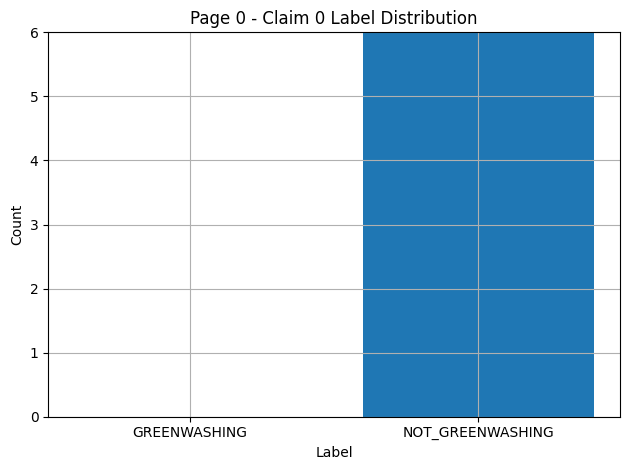

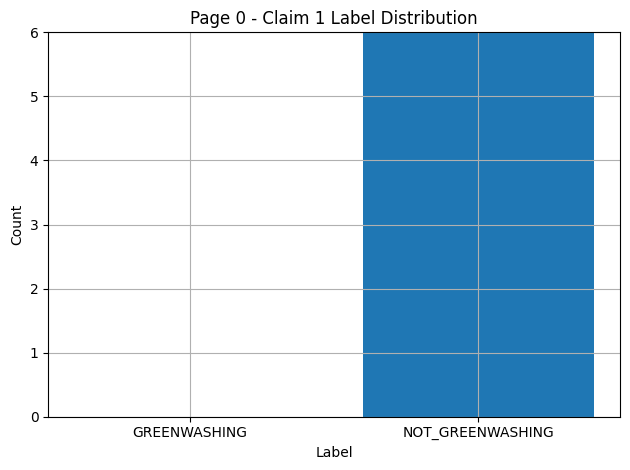

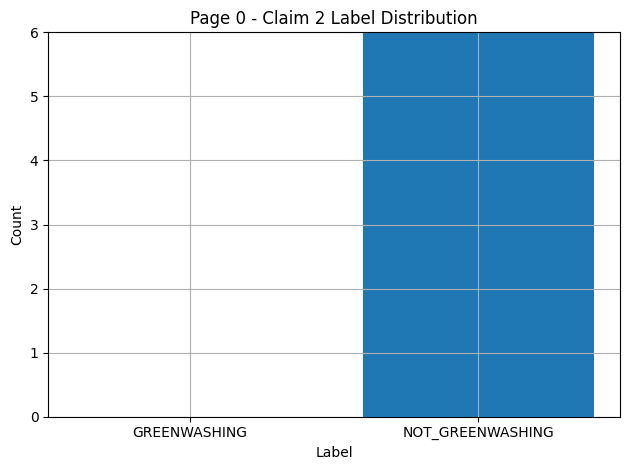

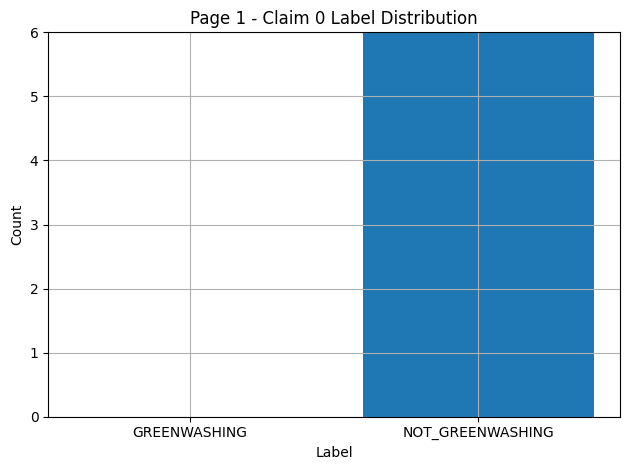

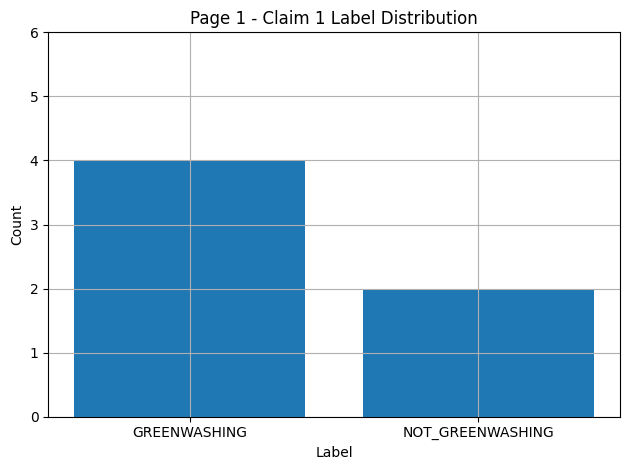

...

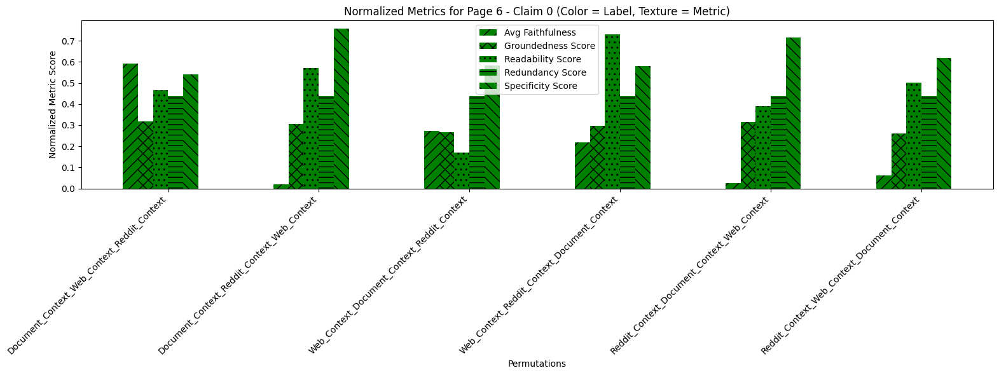

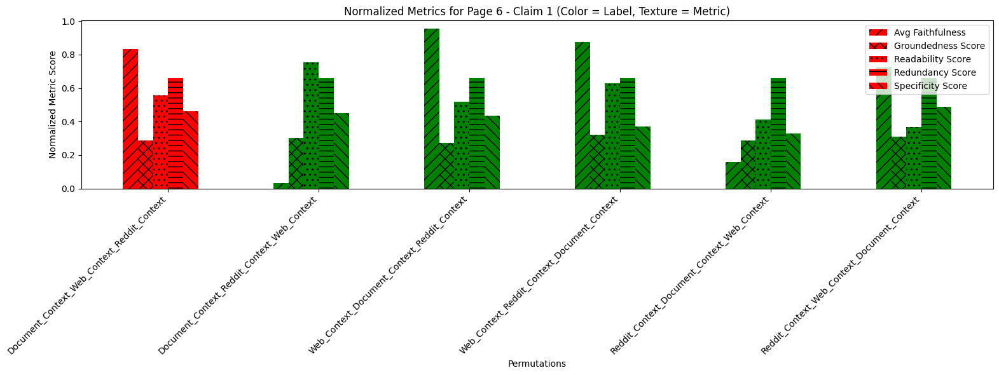

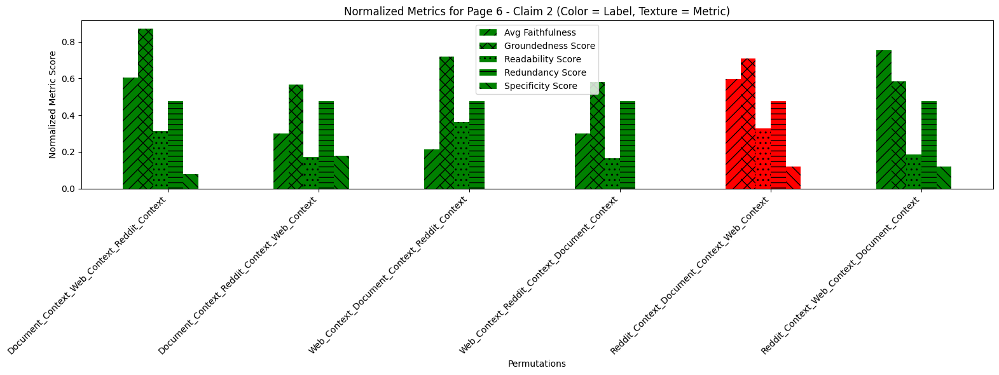

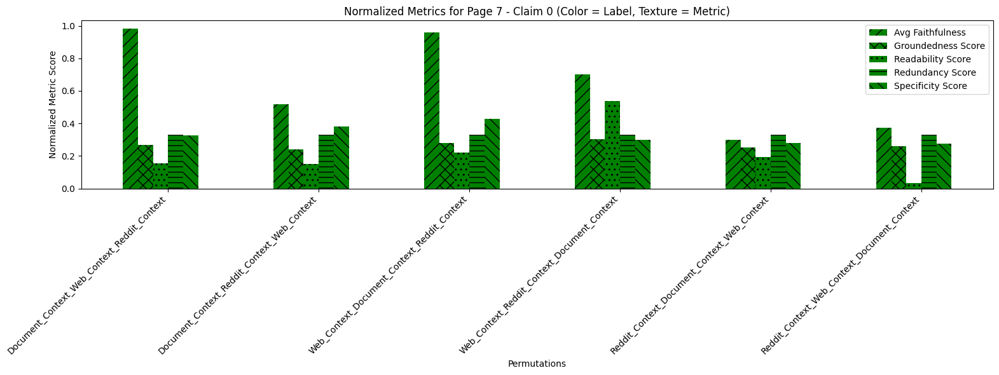

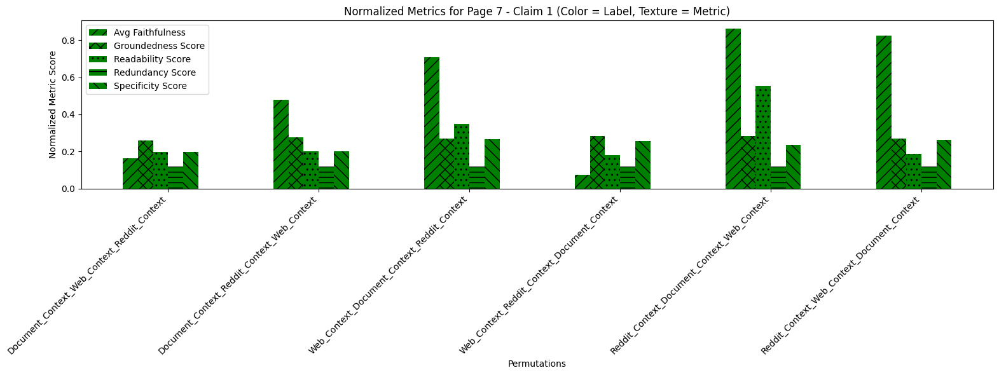

['meta_cti_results_0_claim', 'meta_cti_results_1_claim', 'meta_cti_results_2_claim', 'meta_cti_results_3_claim']
Processing Page: 0
claim set {'2', '3', '0', '1'}
Total claims: 4
Marked claims: 0 Page: 0
Processing Page: 1
claim set {'2', '3', '0', '1'}
Total claims: 4
Marked claims: 3 Page: 1
Processing Page: 2
claim set {'2', '3', '0', '1'}
Total claims: 4
Marked claims: 4 Page: 2
Processing Page: 3
claim set {'2', '3', '0', '1'}
Total claims: 4
Marked claims: 2 Page: 3
Processing Page: 4
claim set {'2', '3', '0', '1'}
Total claims: 4
Marked claims: 2 Page: 4
Processing Page: 5
claim set {'2', '3', '0', '1'}
Total claims: 4
Marked claims: 2 Page: 5
Processing Page: 6
claim set {'2', '3', '0', '1'}
Total claims: 4
Marked claims: 3 Page: 6
Processing Page: 7
claim set {'2', '3', '0', '1'}
Total claims: 4
Marked claims: 2 Page: 7
      page_id  total_claims  commitment_yes  detection_yes  \
0  page_idx_0             0               0              0   
1  page_idx_1             3        

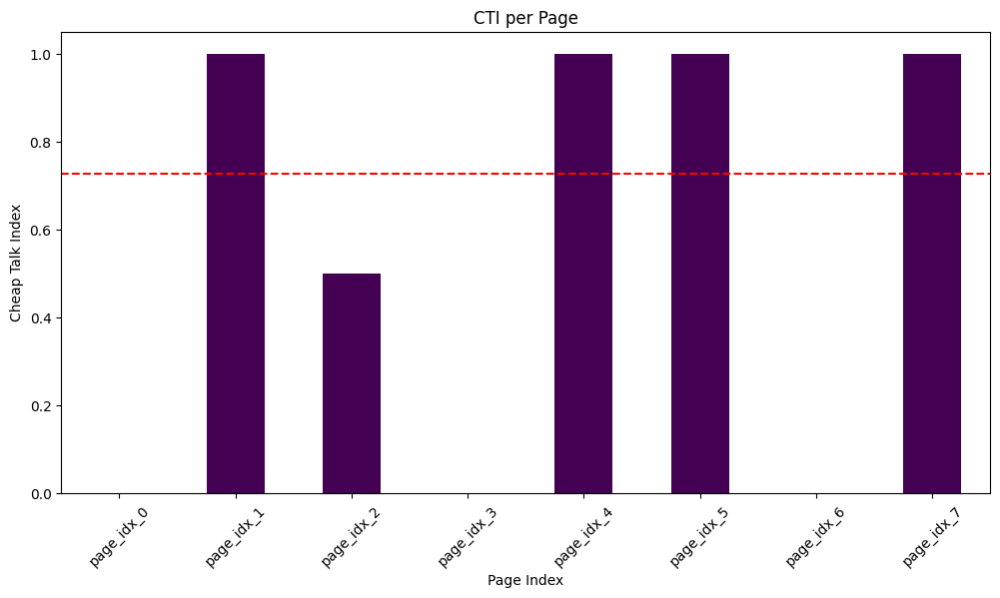

Overall CTI: 0.7273


In [85]:
document = Document.from_json_file('results/fy2023-walmart-esg-highlights-3-10.pdf.json')
df = document.to_dataframe_ext(level='page')
result_df = analyze_claim_label_discrepancies(df1)

# Plotting
grouped = result_df.groupby(['page_index', 'claim_index']).sum(numeric_only=True).reset_index()

# Bar plot per claim across pages
for (page, claim), group in grouped.groupby(['page_index', 'claim_index']):
    plt.figure()
    plt.bar(['GREENWASHING', 'NOT_GREENWASHING'], [group['GREENWASHING'].values[0], group['NOT_GREENWASHING'].values[0]])
    plt.title(f"Page {page} - Claim {claim} Label Distribution")
    plt.ylabel("Count")
    plt.xlabel("Label")
    plt.ylim(0, 6)
    plt.grid(True)
    plt.tight_layout()
    plt.show()

eval_metric_map = {
    "faith_eval": "avg_faithfulness",
    "groundedness_eval": "groundedness_score",
    "readability_eval": "readability_score",
    "redundancy_eval": "redundancy_score",
    "specificity_eval": "specificity_score",
}

label_colors = {
    "GREENWASHING": "red",
    "NOT_GREENWASHING": "green",
    "INVALID": "gray"
}

metric_values = {metric: [] for metric in eval_metric_map.values()}
for col in df.columns:
    for suffix, metric in eval_metric_map.items():
        if col.endswith(f"_{suffix}"):
            df[col] = df[col].apply(lambda x: x if isinstance(x, dict) else {})
            metric_values[metric].extend([
                val[metric] for val in df[col] if metric in val
            ])

scalers = {
    metric: MinMaxScaler().fit(np.array(vals).reshape(-1, 1)) 
    for metric, vals in metric_values.items() if vals
}

from collections import defaultdict

for page_index, row in df.iterrows():
    perm_data = {}

    for col in df.columns:
        for suffix, metric in eval_metric_map.items():
            if col.endswith(f"_{suffix}"):
                match = re.search(r"claim_(\d+)", col)
                if not match:
                    continue
                claim_idx = int(match.group(1))
                base_key = col.replace(f"_{suffix}", "")
                val = row[col]
                if isinstance(val, dict) and metric in val and metric in scalers:
                    norm_val = scalers[metric].transform([[val[metric]]])[0][0]
                    key = (page_index, claim_idx, base_key)
                    if key not in perm_data:
                        perm_data[key] = {"scores": {}, "label": "INVALID"}
                    perm_data[key]["scores"][metric] = norm_val

    perm_data = {
        key: value for key, value in perm_data.items() if value["scores"]
    }

    for (pg, claim_idx, base_key) in perm_data:
        label_col = f"{base_key}_label"
        label_val = row.get(label_col, "")
        norm_label = label_val.strip().replace("*", "").upper() if isinstance(label_val, str) else "INVALID"
        perm_data[(pg, claim_idx, base_key)]["label"] = norm_label if norm_label in label_colors else "INVALID"

    claims_grouped = defaultdict(list)
    for (pg, claim_idx, base_key), data in perm_data.items():
        claims_grouped[claim_idx].append((base_key, data["scores"], data["label"]))

    for claim_idx, entries in claims_grouped.items():
        metrics = list(eval_metric_map.values())
        bar_width = 0.1
        x = range(len(entries))
        offsets = [i * bar_width for i in range(len(metrics))]

        plt.figure(figsize=(16, 6))

        for i, metric in enumerate(metrics):
            values = [scores.get(metric, 0) for _, scores, _ in entries]
            colors = [label_colors[label] for _, _, label in entries]
            h = metric_hatches.get(metric, '')
            bars = plt.bar(
                [xi + offsets[i] for xi in x], values,
                width=bar_width,
                label=metric.replace("_", " ").title(),
                color=colors,
                hatch=h
            )

        xticklabels = [re.sub(r"meta_aggregator_|_result.*", "", key) for key, _, _ in entries]
        plt.xticks([xi + bar_width * (len(metrics) / 2) for xi in x], xticklabels, rotation=45, ha="right")

        plt.xlabel("Permutations")
        plt.ylabel("Normalized Metric Score")
        plt.title(f"Normalized Metrics for Page {page_index} - Claim {claim_idx} (Color = Label, Texture = Metric)")
        plt.legend()
        plt.tight_layout()
        plt.show()

import pandas as pd
import re

def analyze_claims(df):
    # Get all column names that match the expected pattern
    claim_cols = [col for col in df.columns if re.match(r"meta_cti_results_\d+_claim", col)]
    print(claim_cols)
    results = []
    total_non_specific_commitment_yes = 0
    total_commitment_yes = 0

    for idx, row in df.iterrows():
        print(f"Processing Page: {idx}")
        
        # Extract the unique claim indices from the claim columns
        claim_set = set(re.findall(r"meta_cti_results_(\d+)_", " ".join(claim_cols)))
        print("claim set", claim_set)
        total_claims = len(claim_set)
        print("Total claims:", total_claims)
        # Filter out claims that have missing detection values
        for claim_idx in claim_set:
            detection_column = f'meta_cti_results_{claim_idx}_cti_metrics_climate'
            
            detection_value = row.get(detection_column, None)
            
            # If the detection_value is a list or array, extract the first element (tuple) and check for NaN
            if isinstance(detection_value, list) and len(detection_value) > 0:
                detection_value = detection_value[0][0]  # Extract the first element of the tuple, e.g., "yes"
            
            # If the detection value is NaN, ignore this claim
            if pd.isna(detection_value):
                total_claims -= 1
                
        print("Marked claims:", total_claims, "Page:", idx)
        commitment_yes = 0
        detection_yes = 0
        non_specific_commitment_yes = 0

        for i in range(total_claims):
            detection_col = f"meta_cti_results_{i}_cti_metrics_climate"
            commitment_col = f"meta_cti_results_{i}_cti_metrics_commitment"
            specificity_col = f"meta_cti_results_{i}_cti_metrics_specificity"

            detection = row.get(detection_col, [])
            commitment = row.get(commitment_col, [])
            specificity = row.get(specificity_col, [])

            # extract the first value from tuples if they exist (tuples have both label and confidence score)
            detection_label = detection[0][0] if isinstance(detection, list) and detection else None
            commitment_label = commitment[0][0] if isinstance(commitment, list) and commitment else None
            specificity_label = specificity[0][0] if isinstance(specificity, list) and specificity else None

            if detection_label == "yes":
                detection_yes += 1

            if commitment_label == "yes":
                commitment_yes += 1
                total_commitment_yes += 1
                if specificity_label == "non":
                    non_specific_commitment_yes += 1
                    total_non_specific_commitment_yes += 1

        # Compute the fraction
        ratio = (non_specific_commitment_yes / commitment_yes) if commitment_yes > 0 else None

        results.append({
            "page_id": row["page_id"],
            "total_claims": total_claims,
            "commitment_yes": commitment_yes,
            "detection_yes": detection_yes,
            "non_specific_commitment_yes": non_specific_commitment_yes,
            "non_specific_commitment_ratio": ratio
        })

    # Compute the overall CTI
    overall_cti = total_non_specific_commitment_yes / total_commitment_yes if total_commitment_yes > 0 else None

    return pd.DataFrame(results), overall_cti

cti_df, overall_cti = analyze_claims(df)

print(cti_df)
print()
if overall_cti is not None:
    print(f"Overall CTI: {overall_cti}")
else:
    print("Overall CTI: N/A")

# bar plot summary_df["non_specific_commitment_ratio"] and overall cti
cti_df["non_specific_commitment_ratio"].plot(kind='bar', figsize=(12, 6), colormap='viridis')
plt.axhline(y=overall_cti, color='red', linestyle='--', label=f'Overall CTI: {overall_cti:.4f}')
plt.xlabel("Page Index")
plt.ylabel("Cheap Talk Index")
plt.title("CTI per Page")
plt.xticks(np.arange(len(cti_df.index)), cti_df["page_id"], rotation=45)
plt.show()

print(f"Overall CTI: {overall_cti:.4f}")


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
from scipy.stats import pearsonr

# --- Step 1: Build full DataFrame from perm_data ---

records = []
for (page_index, claim_idx, permutation), val in perm_data.items():
    record = {
        "page_index": page_index,
        "claim_index": claim_idx,
        "permutation": re.sub(r"meta_aggregator_|_result.*", "", permutation),
        "label": val["label"]
    }
    record.update(val["scores"])  # includes faithfulness, groundedness, etc.
    records.append(record)

perm_df = pd.DataFrame(records)

# --- Step 2: Encode label (GREENWASHING = 1, NOT_GREENWASHING = 0) ---

perm_df["label_numeric"] = perm_df["label"].map({
    "GREENWASHING": 1,
    "NOT_GREENWASHING": 0
})

# --- Step 3: Merge CTI per page ---

cti_df["page_index"] = cti_df.index
perm_df = pd.merge(perm_df, cti_df[["page_index", "non_specific_commitment_ratio"]], on="page_index", how="left")

# --- Step 4: Correlation per permutation and per metric ---

eval_metrics = ["avg_faithfulness", "groundedness_score", "readability_score", "redundancy_score", "specificity_score"]
results = []

for permutation, group in perm_df.groupby("permutation"):
    for metric in eval_metrics:
        sub = group[[metric, "label_numeric", "non_specific_commitment_ratio"]].dropna()

        if len(sub) < 2:
            continue  # skip insufficient data

        try:
            label_corr, _ = pearsonr(sub[metric], sub["label_numeric"])
        except Exception as e:
            print(f"Label correlation failed for {permutation}, {metric}: {e}")
            label_corr = None

        try:
            cti_corr, _ = pearsonr(sub[metric], sub["non_specific_commitment_ratio"])
        except Exception as e:
            print(f"CTI correlation failed for {permutation}, {metric}: {e}")
            cti_corr = None

        results.append({
            "permutation": permutation,
            "metric": metric,
            "label_corr": label_corr,
            "cti_corr": cti_corr,
            "n_samples": len(sub)
        })

# --- Step 5: Create DataFrame from correlation results ---

corr_df = pd.DataFrame(results)

# --- Step 6: Visualize ---

if not corr_df.empty:
    # Heatmap: label correlation
    pivot_label = corr_df.pivot(index="permutation", columns="metric", values="label_corr")
    plt.figure(figsize=(12, 6))
    sns.heatmap(pivot_label, annot=True, center=0, cmap="coolwarm", fmt=".2f")
    plt.title("Correlation between Label and Metrics (per permutation)")
    plt.tight_layout()
    plt.show()

    # Heatmap: CTI correlation
    pivot_cti = corr_df.pivot(index="permutation", columns="metric", values="cti_corr")
    plt.figure(figsize=(12, 6))
    sns.heatmap(pivot_cti, annot=True, center=0, cmap="coolwarm", fmt=".2f")
    plt.title("Correlation between CTI and Metrics (per permutation)")
    plt.tight_layout()
    plt.show()
else:
    print("No valid correlation results found (not enough data per permutation).")


No valid correlation results found (not enough data per permutation).


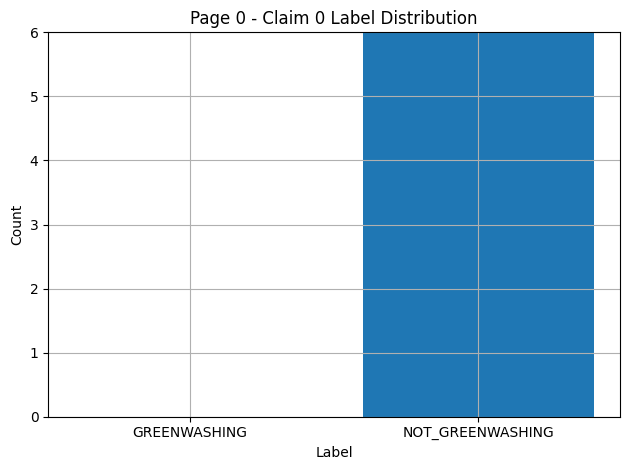

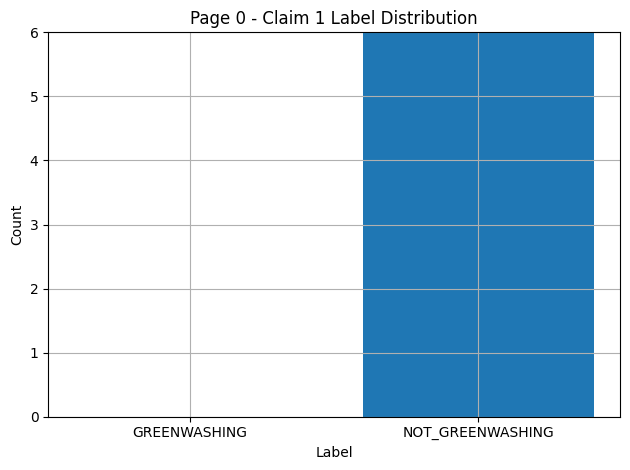

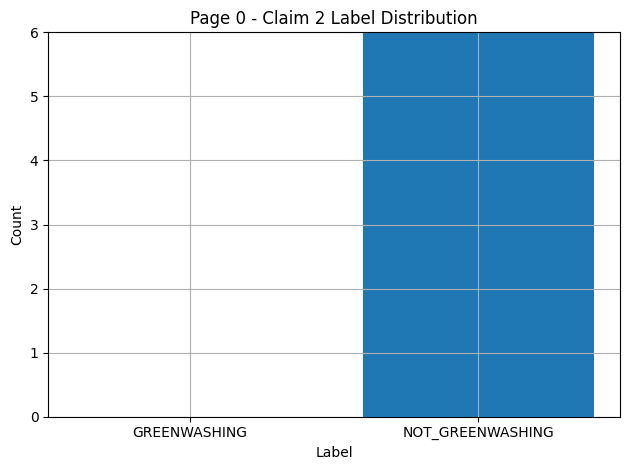

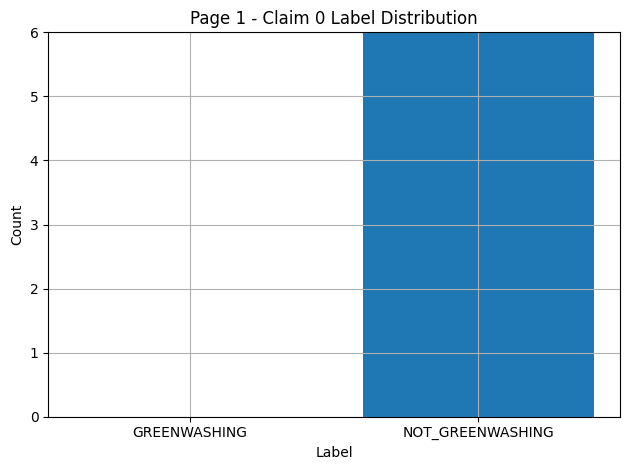

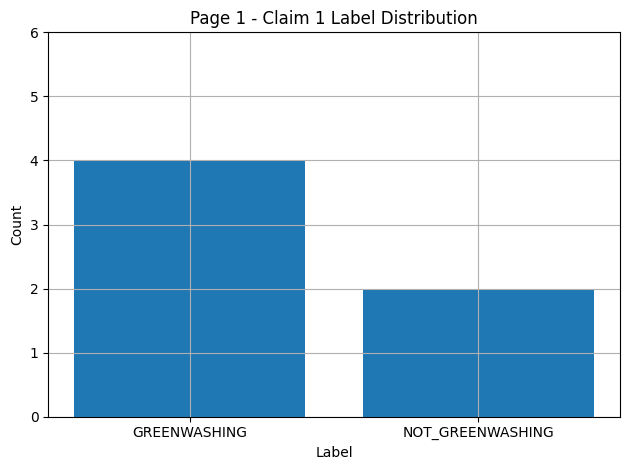

...

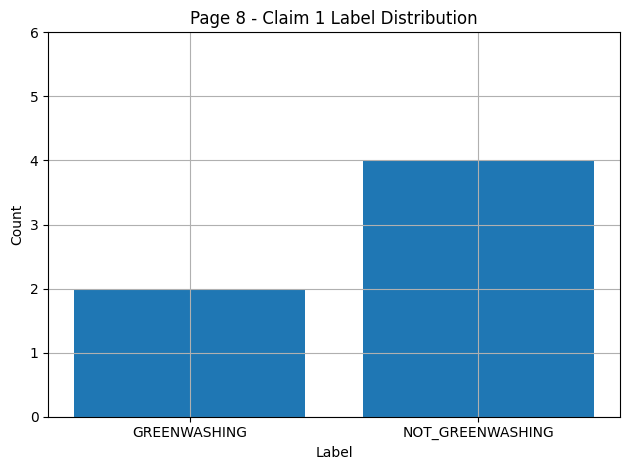

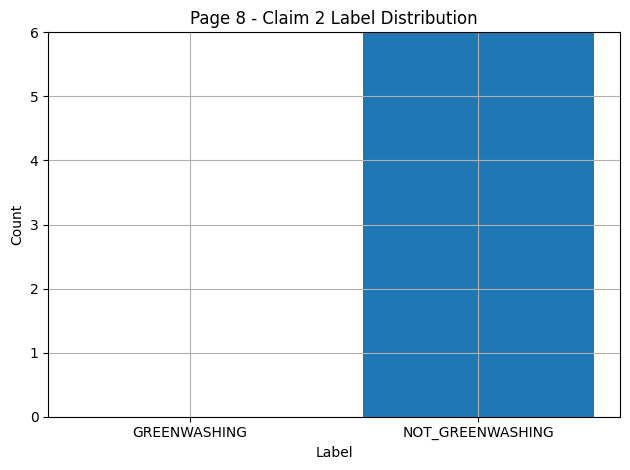

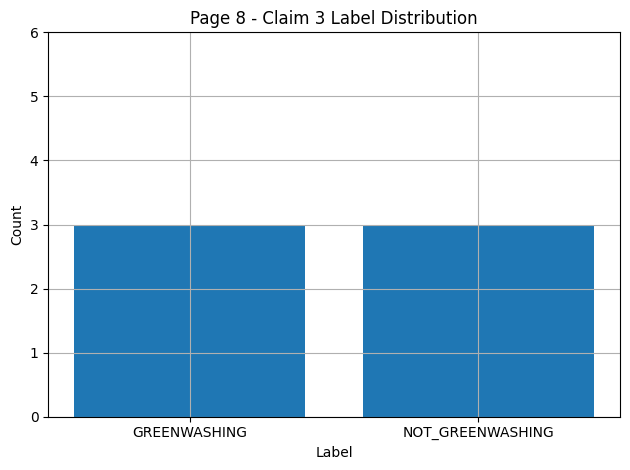

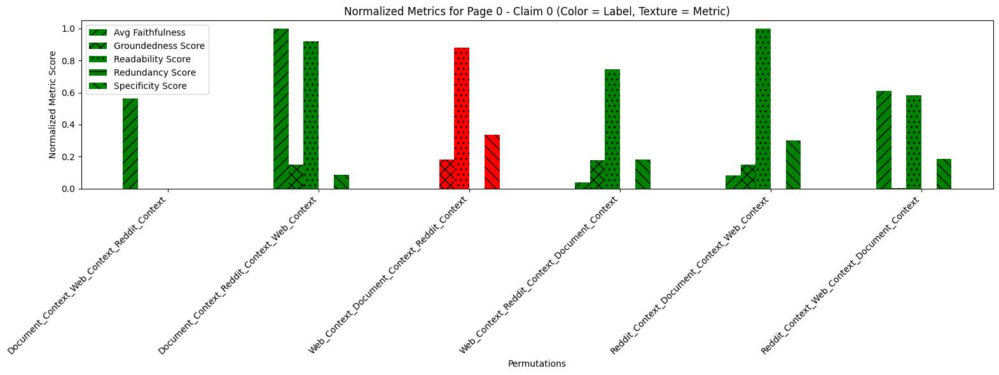

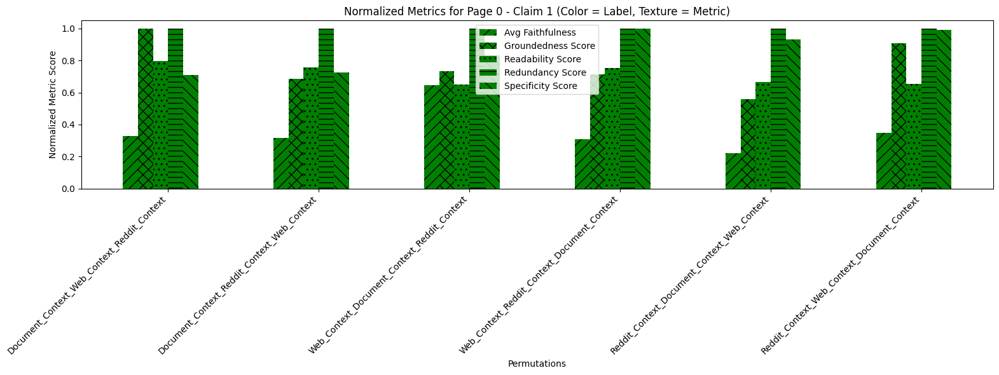

['meta_cti_results_0_claim', 'meta_cti_results_1_claim']
Processing Page: 0
claim set {'0', '1'}
Total claims: 2
Marked claims: 2 Page: 0
Processing Page: 1
claim set {'0', '1'}
Total claims: 2
Marked claims: 0 Page: 1
Processing Page: 2
claim set {'0', '1'}
Total claims: 2
Marked claims: 0 Page: 2
Processing Page: 3
claim set {'0', '1'}
Total claims: 2
Marked claims: 0 Page: 3
Processing Page: 4
claim set {'0', '1'}
Total claims: 2
Marked claims: 0 Page: 4
Processing Page: 5
claim set {'0', '1'}
Total claims: 2
Marked claims: 0 Page: 5
Processing Page: 6
claim set {'0', '1'}
Total claims: 2
Marked claims: 0 Page: 6
Processing Page: 7
claim set {'0', '1'}
Total claims: 2
Marked claims: 0 Page: 7
      page_id  total_claims  commitment_yes  detection_yes  \
0  page_idx_0             2               2              2   
1  page_idx_1             0               0              0   
2  page_idx_2             0               0              0   
3  page_idx_3             0               0    

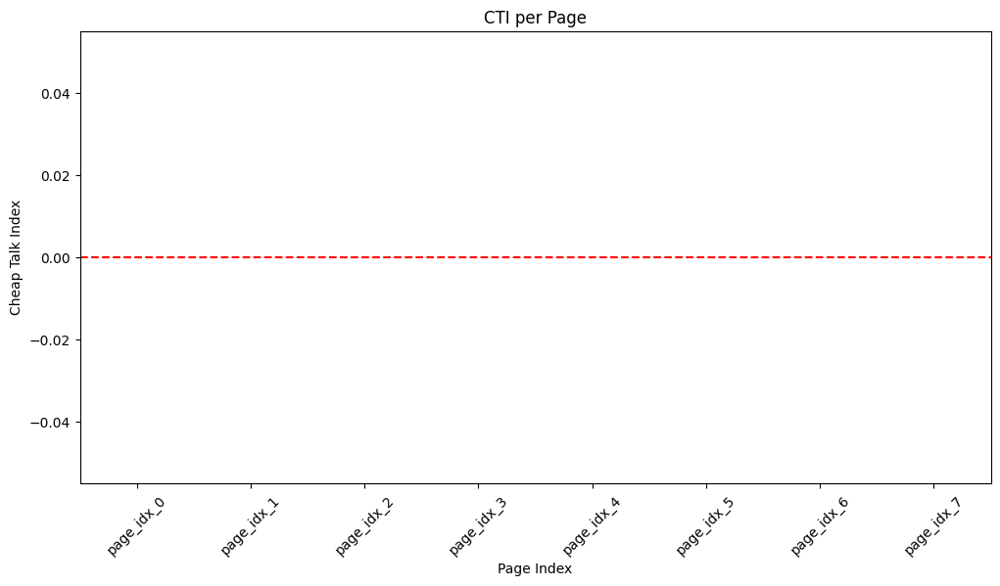

Overall CTI: 0.0000


In [78]:
document = Document.from_json_file('results/shell-annual-report-2024-95-102.pdf.json')
df = document.to_dataframe_ext(level='page')
result_df = analyze_claim_label_discrepancies(df1)

# Plotting
grouped = result_df.groupby(['page_index', 'claim_index']).sum(numeric_only=True).reset_index()

# Bar plot per claim across pages
for (page, claim), group in grouped.groupby(['page_index', 'claim_index']):
    plt.figure()
    plt.bar(['GREENWASHING', 'NOT_GREENWASHING'], [group['GREENWASHING'].values[0], group['NOT_GREENWASHING'].values[0]])
    plt.title(f"Page {page} - Claim {claim} Label Distribution")
    plt.ylabel("Count")
    plt.xlabel("Label")
    plt.ylim(0, 6)
    plt.grid(True)
    plt.tight_layout()
    plt.show()

eval_metric_map = {
    "faith_eval": "avg_faithfulness",
    "groundedness_eval": "groundedness_score",
    "readability_eval": "readability_score",
    "redundancy_eval": "redundancy_score",
    "specificity_eval": "specificity_score",
}

label_colors = {
    "GREENWASHING": "red",
    "NOT_GREENWASHING": "green",
    "INVALID": "gray"
}

metric_values = {metric: [] for metric in eval_metric_map.values()}
for col in df.columns:
    for suffix, metric in eval_metric_map.items():
        if col.endswith(f"_{suffix}"):
            df[col] = df[col].apply(lambda x: x if isinstance(x, dict) else {})
            metric_values[metric].extend([
                val[metric] for val in df[col] if metric in val
            ])

scalers = {
    metric: MinMaxScaler().fit(np.array(vals).reshape(-1, 1)) 
    for metric, vals in metric_values.items() if vals
}

from collections import defaultdict

for page_index, row in df.iterrows():
    perm_data = {}

    for col in df.columns:
        for suffix, metric in eval_metric_map.items():
            if col.endswith(f"_{suffix}"):
                match = re.search(r"claim_(\d+)", col)
                if not match:
                    continue
                claim_idx = int(match.group(1))
                base_key = col.replace(f"_{suffix}", "")
                val = row[col]
                if isinstance(val, dict) and metric in val and metric in scalers:
                    norm_val = scalers[metric].transform([[val[metric]]])[0][0]
                    key = (page_index, claim_idx, base_key)
                    if key not in perm_data:
                        perm_data[key] = {"scores": {}, "label": "INVALID"}
                    perm_data[key]["scores"][metric] = norm_val

    perm_data = {
        key: value for key, value in perm_data.items() if value["scores"]
    }

    for (pg, claim_idx, base_key) in perm_data:
        label_col = f"{base_key}_label"
        label_val = row.get(label_col, "")
        norm_label = label_val.strip().replace("*", "").upper() if isinstance(label_val, str) else "INVALID"
        perm_data[(pg, claim_idx, base_key)]["label"] = norm_label if norm_label in label_colors else "INVALID"

    claims_grouped = defaultdict(list)
    for (pg, claim_idx, base_key), data in perm_data.items():
        claims_grouped[claim_idx].append((base_key, data["scores"], data["label"]))

    for claim_idx, entries in claims_grouped.items():
        metrics = list(eval_metric_map.values())
        bar_width = 0.1
        x = range(len(entries))
        offsets = [i * bar_width for i in range(len(metrics))]

        plt.figure(figsize=(16, 6))

        for i, metric in enumerate(metrics):
            values = [scores.get(metric, 0) for _, scores, _ in entries]
            colors = [label_colors[label] for _, _, label in entries]
            h = metric_hatches.get(metric, '')
            bars = plt.bar(
                [xi + offsets[i] for xi in x], values,
                width=bar_width,
                label=metric.replace("_", " ").title(),
                color=colors,
                hatch=h
            )

        xticklabels = [re.sub(r"meta_aggregator_|_result.*", "", key) for key, _, _ in entries]
        plt.xticks([xi + bar_width * (len(metrics) / 2) for xi in x], xticklabels, rotation=45, ha="right")

        plt.xlabel("Permutations")
        plt.ylabel("Normalized Metric Score")
        plt.title(f"Normalized Metrics for Page {page_index} - Claim {claim_idx} (Color = Label, Texture = Metric)")
        plt.legend()
        plt.tight_layout()
        plt.show()


def analyze_claims(df):
    # Get all column names that match the expected pattern
    claim_cols = [col for col in df.columns if re.match(r"meta_cti_results_\d+_claim", col)]
    print(claim_cols)
    results = []
    total_non_specific_commitment_yes = 0
    total_commitment_yes = 0

    for idx, row in df.iterrows():
        print(f"Processing Page: {idx}")
        
        # Extract the unique claim indices from the claim columns
        claim_set = set(re.findall(r"meta_cti_results_(\d+)_", " ".join(claim_cols)))
        print("claim set", claim_set)
        total_claims = len(claim_set)
        print("Total claims:", total_claims)
        # Filter out claims that have missing detection values
        for claim_idx in claim_set:
            detection_column = f'meta_cti_results_{claim_idx}_cti_metrics_climate'
            
            detection_value = row.get(detection_column, None)
            
            # If the detection_value is a list or array, extract the first element (tuple) and check for NaN
            if isinstance(detection_value, list) and len(detection_value) > 0:
                detection_value = detection_value[0][0]  # Extract the first element of the tuple, e.g., "yes"
            
            # If the detection value is NaN, ignore this claim
            if pd.isna(detection_value):
                total_claims -= 1
                
        print("Marked claims:", total_claims, "Page:", idx)
        commitment_yes = 0
        detection_yes = 0
        non_specific_commitment_yes = 0

        for i in range(total_claims):
            detection_col = f"meta_cti_results_{i}_cti_metrics_climate"
            commitment_col = f"meta_cti_results_{i}_cti_metrics_commitment"
            specificity_col = f"meta_cti_results_{i}_cti_metrics_specificity"

            detection = row.get(detection_col, [])
            commitment = row.get(commitment_col, [])
            specificity = row.get(specificity_col, [])

            # extract the first value from tuples if they exist (tuples have both label and confidence score)
            detection_label = detection[0][0] if isinstance(detection, list) and detection else None
            commitment_label = commitment[0][0] if isinstance(commitment, list) and commitment else None
            specificity_label = specificity[0][0] if isinstance(specificity, list) and specificity else None

            if detection_label == "yes":
                detection_yes += 1

            if commitment_label == "yes":
                commitment_yes += 1
                total_commitment_yes += 1
                if specificity_label == "non":
                    non_specific_commitment_yes += 1
                    total_non_specific_commitment_yes += 1

        # Compute the fraction
        ratio = (non_specific_commitment_yes / commitment_yes) if commitment_yes > 0 else None

        results.append({
            "page_id": row["page_id"],
            "total_claims": total_claims,
            "commitment_yes": commitment_yes,
            "detection_yes": detection_yes,
            "non_specific_commitment_yes": non_specific_commitment_yes,
            "non_specific_commitment_ratio": ratio
        })

    # Compute the overall CTI
    overall_cti = total_non_specific_commitment_yes / total_commitment_yes if total_commitment_yes > 0 else None

    return pd.DataFrame(results), overall_cti

cti_df, overall_cti = analyze_claims(df)

print(cti_df)
print()
if overall_cti is not None:
    print(f"Overall CTI: {overall_cti}")
else:
    print("Overall CTI: N/A")

# bar plot summary_df["non_specific_commitment_ratio"] and overall cti
cti_df["non_specific_commitment_ratio"].plot(kind='bar', figsize=(12, 6), colormap='viridis')
plt.axhline(y=overall_cti, color='red', linestyle='--', label=f'Overall CTI: {overall_cti:.4f}')
plt.xlabel("Page Index")
plt.ylabel("Cheap Talk Index")
plt.title("CTI per Page")
plt.xticks(np.arange(len(cti_df.index)), cti_df["page_id"], rotation=45)
plt.show()

print(f"Overall CTI: {overall_cti:.4f}")
